In [1]:
import pickle 
import os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.collections as collections
from sklearn.metrics import mean_squared_error as msem
from matplotlib.ticker import MaxNLocator

sns.set_style("whitegrid")
os.makedirs('./supporting_information/paper_plots', exist_ok = True)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
TEST_STORM_DATES = [
 ['19980622', '199806302359'],
 ['19981102', '199811122359'],
 ['19990109', '199901182359'],
 ['19990413', '199904192359'],
 ['20000116', '200001262359'],
 ['20000402', '200004122359'],
 ['20000519', '200005282359'],
 ['20010326', '200104042359'],
 ['20030526', '200306062359'],
 ['20030708', '200307182359'],
 ['20040118', '200401272359'],
 ['20041104', '200411142359'],
 ['20120910', '201210052359'],
 ['20130528', '201306042359'],
 ['20130626', '201307042359'],
 ['20150311', '201503212359'],
 ['20180822', '201809032359']
]

def convert_to_datetime(date):
    if len(date) == 8:
        return pd.to_datetime(date, format="%Y%m%d", errors="raise")
    elif len(date) == 12:
        return pd.to_datetime(date, format="%Y%m%d%H%M", errors="raise")
    else:
        return pd.to_datetime(
            date, errors="raise", infer_datetime_format=True, utc=True
        )

TEST_STORM_STARTS = []
TEST_STORM_ENDS = []

for date_start, date_end in TEST_STORM_DATES:
    TEST_STORM_STARTS.append(convert_to_datetime(date_start))
    TEST_STORM_ENDS.append(convert_to_datetime(date_end))

model_names = [
    '1h swics',
    '1h rt',    
    '2h swics',
    '2h rt',    
]

storm_indices = np.arange(26, 43)
start_storm_index = 26

In [3]:
!ls

LICENSE
README.md
metrics_and_plots-revision-REEE.ipynb
metrics_and_plots-revision.ipynb
metrics_and_plots.ipynb
predictions_SYM-H_1hour_no_swics.csv
predictions_SYM-H_1hour_revision_REAL_TIME_6.841.csv
predictions_SYM-H_1hour_revision_swics_6.652.csv
predictions_SYM-H_1hour_swics.csv
predictions_SYM-H_1hour_swics_on_no_swics.csv
predictions_SYM-H_2hour_no_swics.csv
predictions_SYM-H_2hour_revision_REAL_TIME_9.782.csv
predictions_SYM-H_2hour_revision_swics_9.554.csv
predictions_SYM-H_2hour_swics.csv
predictions_SYM-H_2hour_swics_model_on_no_swics.csv
rmses.csv
supporting_information
test_data_swepam.csv


In [4]:
df_60_swics = pd.read_csv('predictions_SYM-H_1hour_revision_swics_6.652.csv')
df_60_rt = pd.read_csv('predictions_SYM-H_1hour_revision_REAL_TIME_6.841.csv')
df_120_swics = pd.read_csv('predictions_SYM-H_2hour_revision_swics_9.554.csv')
df_120_rt = pd.read_csv('predictions_SYM-H_2hour_revision_REAL_TIME_9.782.csv')
rmses = pd.read_csv('rmses.csv')
df_swepam = pd.read_csv('test_data_swepam.csv', parse_dates = ['datetime']).set_index('datetime')
df_swepam['missing_swepam'] = df_swepam.isna().any(axis = 1)
df_swepam['missing_swepam_float'] = df_swepam['missing_swepam'].astype(float)
df_swepam.index = df_swepam.index.tz_localize(None)

In [5]:
df_60_swics['datetime'] = pd.to_datetime(df_60_swics['datetime'])
df_60_swics['predicted_SYM_H_1h_swics'] = df_60_swics['predicted_SYM_H-t60'].shift(12)
df_60_swics = df_60_swics.set_index('datetime')
df_60_rt['datetime'] = pd.to_datetime(df_60_rt['datetime'])
df_60_rt['predicted_SYM_H_1h_real_time'] = df_60_rt['predicted_SYM_H-t60'].shift(12)
df_60_rt = df_60_rt.set_index('datetime')
df_120_swics['datetime'] = pd.to_datetime(df_120_swics['datetime'])
df_120_swics['predicted_SYM_H_2h_swics'] = df_120_swics['predicted_SYM_H-t120'].shift(24)
df_120_swics = df_120_swics.set_index('datetime')
df_120_rt['datetime'] = pd.to_datetime(df_120_rt['datetime'])
df_120_rt['predicted_SYM_H_2h_real_time'] = df_120_rt['predicted_SYM_H-t120'].shift(24)
df_120_rt = df_120_rt.set_index('datetime')

all_dataframes = [
    df_60_swics,
    df_60_rt,    
    df_120_swics,
    df_120_rt,    
]

In [6]:
for model_index in range(len(model_names)):
    
    for i,st_ind in enumerate(storm_indices):         
        dfx = all_dataframes[model_index].loc[all_dataframes[model_index]['storm_index'] == st_ind].copy()
        dfx = dfx[TEST_STORM_STARTS[i]:TEST_STORM_ENDS[i]].copy()
        mse = msem(dfx.iloc[:, 1], dfx.iloc[:, -1], squared = False)        
        print(f'Model: {model_names[model_index]}, storm {st_ind}: RMSE:{mse:.3f} from {dfx.index[0]} until {dfx.index[-1]}')
        rmses.loc[i, model_names[model_index]] = mse
        
    rmses.loc[17, model_names[model_index]] = np.mean(rmses.loc[:, model_names[model_index]].values[:-1])

Model: 1h swics, storm 26: RMSE:5.171 from 1998-06-22 00:00:00 until 1998-06-30 23:55:00
Model: 1h swics, storm 27: RMSE:7.455 from 1998-11-02 00:00:00 until 1998-11-12 23:55:00
Model: 1h swics, storm 28: RMSE:4.697 from 1999-01-09 00:00:00 until 1999-01-18 23:55:00
Model: 1h swics, storm 29: RMSE:4.941 from 1999-04-13 00:00:00 until 1999-04-19 23:55:00
Model: 1h swics, storm 30: RMSE:3.919 from 2000-01-16 00:00:00 until 2000-01-26 23:55:00
Model: 1h swics, storm 31: RMSE:6.700 from 2000-04-02 00:00:00 until 2000-04-12 23:55:00
Model: 1h swics, storm 32: RMSE:6.357 from 2000-05-19 00:00:00 until 2000-05-28 23:55:00
Model: 1h swics, storm 33: RMSE:14.217 from 2001-03-26 00:00:00 until 2001-04-04 23:55:00
Model: 1h swics, storm 34: RMSE:9.777 from 2003-05-26 00:00:00 until 2003-06-06 23:55:00
Model: 1h swics, storm 35: RMSE:6.089 from 2003-07-08 00:00:00 until 2003-07-18 23:55:00
Model: 1h swics, storm 36: RMSE:7.594 from 2004-01-18 00:00:00 until 2004-01-27 23:55:00
Model: 1h swics, sto

In [7]:
print('One hour ahead rmse metrics')
display(rmses[['Storm Nº',model_names[0],model_names[1],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].round(3))

One hour ahead rmse metrics


,Storm Nº,1h swics,1h rt,GBM 1h ahead,LSTM-CNN 1h ahead,Siciliano 1h ahead,Persistence 1h ahead,Burton 1h ahead
0,26,5.171,5.355,5.863,6.630,6.700,7.631,6.839
1,27,7.455,7.655,7.729,8.913,8.900,9.623,7.955
2,28,4.697,4.945,4.281,5.858,5.400,5.814,5.697
3,29,4.941,5.218,5.833,6.683,7.200,7.174,6.511
4,30,3.919,4.156,4.927,5.200,5.600,4.810,4.614
5,31,6.700,6.707,8.277,8.584,10.700,10.429,8.838
6,32,6.357,6.654,6.841,7.259,8.300,10.528,9.487
7,33,14.217,14.211,14.492,13.340,16.300,21.167,16.630
8,34,9.777,10.215,10.190,10.034,11.300,10.913,10.888
9,35,6.089,6.197,7.154,7.693,8.500,8.011,7.918


In [8]:
print('Two hour ahead rmse metrics')
display(rmses[['Storm Nº',model_names[2],model_names[3],'GBM 2h ahead',
               'LSTM-CNN 2h ahead','Persistence 2h ahead','Burton 2h ahead']].round(3))

Two hour ahead rmse metrics


,Storm Nº,2h swics,2h rt,GBM 2h ahead,LSTM-CNN 2h ahead,Persistence 2h ahead,Burton 2h ahead
0,26,7.937,8.144,8.285,8.899,12.374,10.690
1,27,11.765,12.144,11.585,13.418,15.387,12.465
2,28,5.236,5.491,5.650,5.877,9.331,8.858
3,29,7.953,8.541,8.826,9.314,11.415,9.776
4,30,5.695,6.040,7.280,7.288,7.416,6.266
5,31,8.738,8.738,12.613,12.436,17.193,13.604
6,32,9.457,9.708,9.927,8.937,15.282,13.766
7,33,18.926,18.930,24.519,18.481,33.927,25.729
8,34,13.800,14.945,13.736,13.941,15.109,14.695
9,35,8.725,8.834,9.504,9.932,11.211,10.586


In [9]:
fss_1h = rmses[['Storm Nº',model_names[0],model_names[1],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].copy()

fss_2h = rmses[['Storm Nº',model_names[2],model_names[3],'GBM 2h ahead','LSTM-CNN 2h ahead',
             'Persistence 2h ahead','Burton 2h ahead']].copy()

for col in fss_1h.columns:
    if col.find('1h') >= 0:
        fss_1h.loc[:, col] = 1 - (rmses.loc[:, col] / rmses.loc[:, 'Burton 1h ahead']) 

for col in fss_2h.columns:
    if col.find('2h') >= 0:
        fss_2h.loc[: ,col] = 1 - (rmses.loc[:, col] / rmses.loc[:, 'Burton 2h ahead'])

In [10]:
print('FSS for 1 hour forecasts')
display(fss_1h.round(3))

FSS for 1 hour forecasts


,Storm Nº,1h swics,1h rt,GBM 1h ahead,LSTM-CNN 1h ahead,Siciliano 1h ahead,Persistence 1h ahead,Burton 1h ahead
0,26,0.244,0.217,0.143,0.031,0.020,-0.116,0.0
1,27,0.063,0.038,0.028,-0.120,-0.119,-0.210,0.0
2,28,0.175,0.132,0.249,-0.028,0.052,-0.021,0.0
3,29,0.241,0.199,0.104,-0.026,-0.106,-0.102,0.0
4,30,0.151,0.099,-0.068,-0.127,-0.214,-0.042,0.0
5,31,0.242,0.241,0.063,0.029,-0.211,-0.180,0.0
6,32,0.330,0.299,0.279,0.235,0.125,-0.110,0.0
7,33,0.145,0.145,0.129,0.198,0.020,-0.273,0.0
8,34,0.102,0.062,0.064,0.078,-0.038,-0.002,0.0
9,35,0.231,0.217,0.096,0.028,-0.074,-0.012,0.0


In [11]:
print('FSS for 2 hours forecasts')
display(fss_2h.round(3))

FSS for 2 hours forecasts


,Storm Nº,2h swics,2h rt,GBM 2h ahead,LSTM-CNN 2h ahead,Persistence 2h ahead,Burton 2h ahead
0,26,0.258,0.238,0.225,0.168,-0.158,0.0
1,27,0.056,0.026,0.071,-0.076,-0.234,0.0
2,28,0.409,0.380,0.362,0.337,-0.053,0.0
3,29,0.187,0.126,0.097,0.047,-0.168,0.0
4,30,0.091,0.036,-0.162,-0.163,-0.184,0.0
5,31,0.358,0.358,0.073,0.086,-0.264,0.0
6,32,0.313,0.295,0.279,0.351,-0.110,0.0
7,33,0.264,0.264,0.047,0.282,-0.319,0.0
8,34,0.061,-0.017,0.065,0.051,-0.028,0.0
9,35,0.176,0.165,0.102,0.062,-0.059,0.0


Plot for storm 26


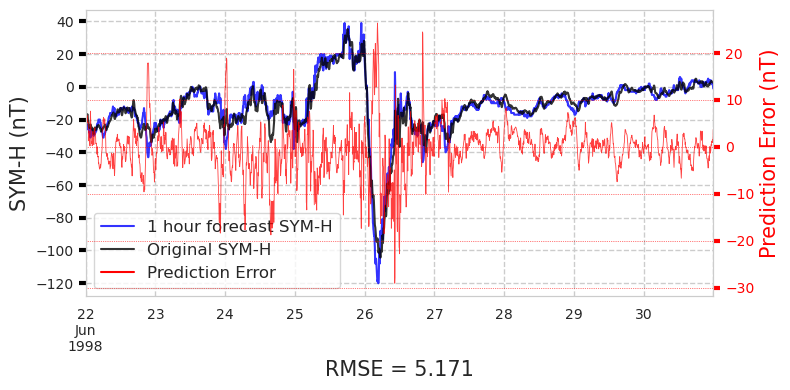

Plot for storm 27


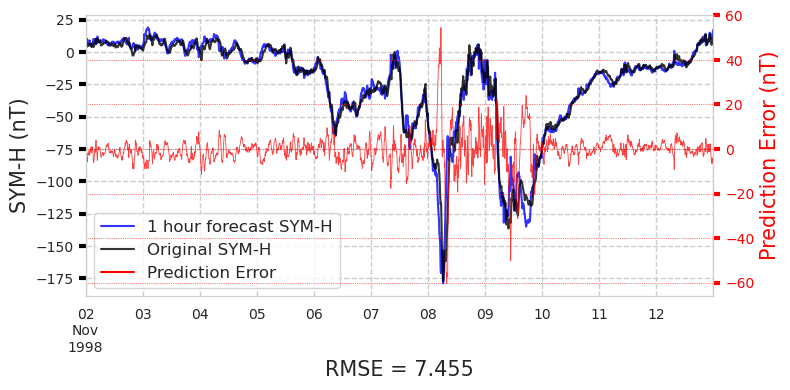

Plot for storm 28


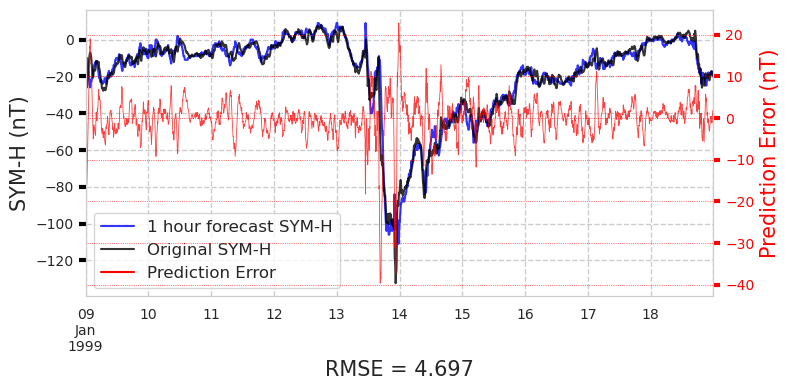

Plot for storm 29


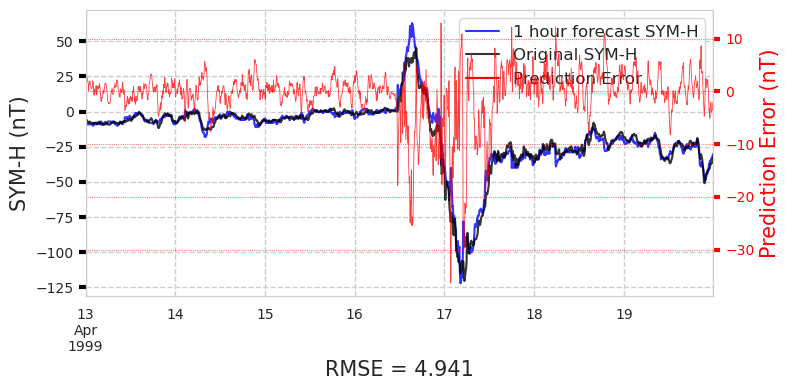

Plot for storm 30


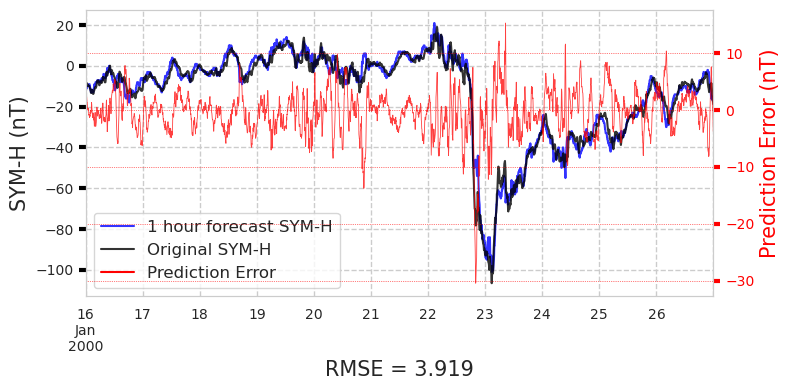

Plot for storm 31


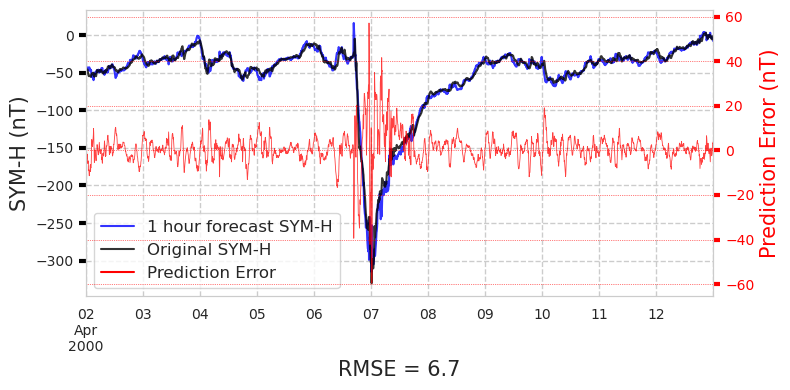

Plot for storm 32


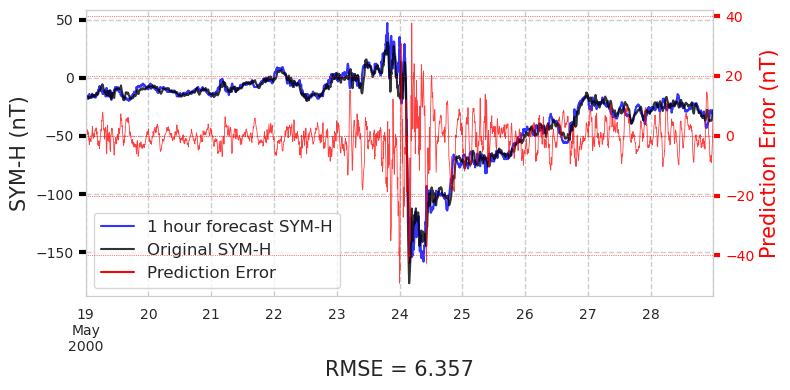

Plot for storm 33


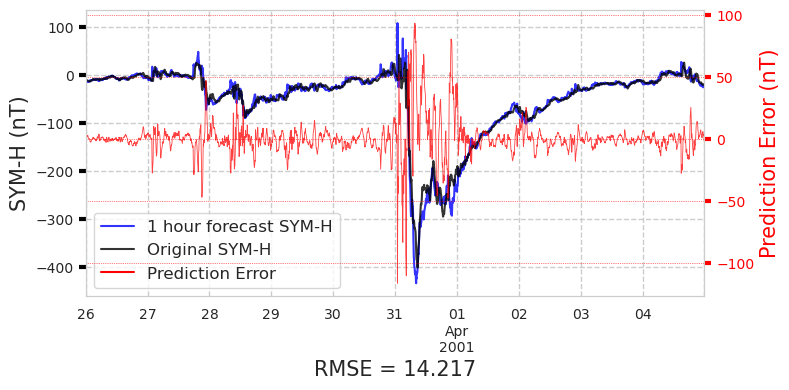

Plot for storm 34


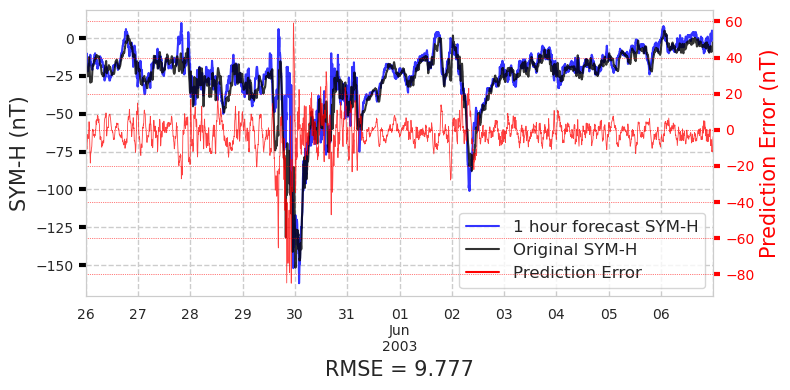

Plot for storm 35


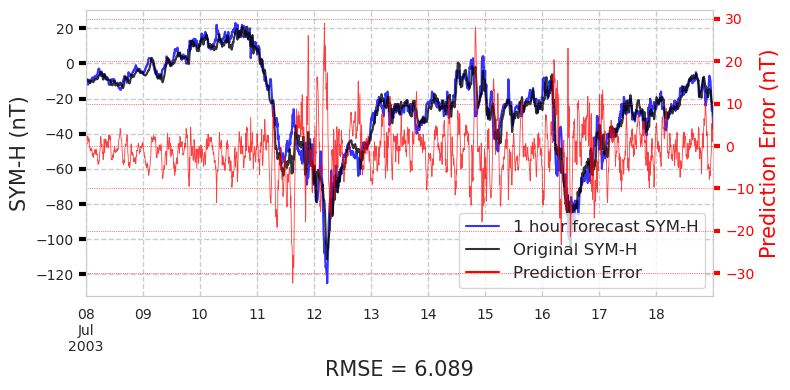

Plot for storm 36


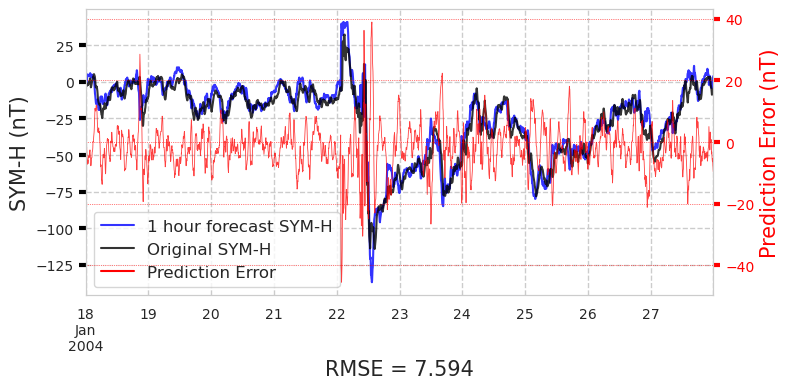

Plot for storm 37


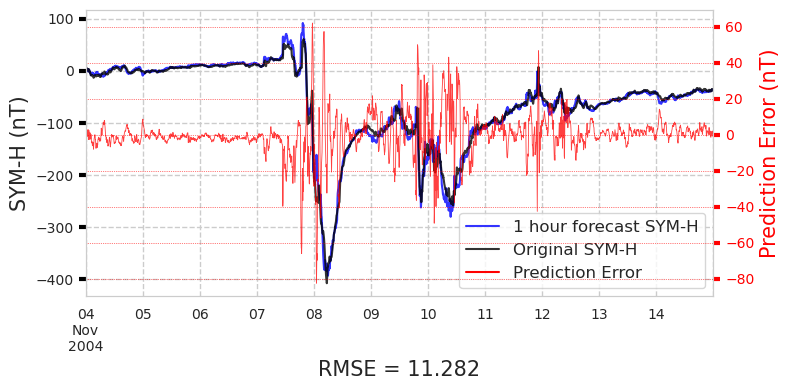

Plot for storm 38


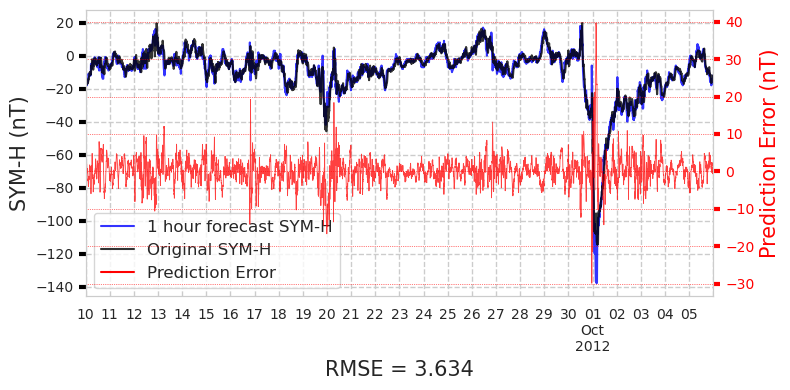

Plot for storm 39


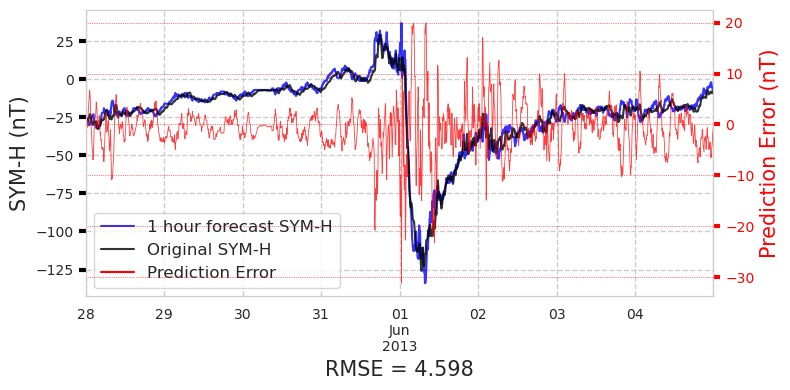

Plot for storm 40


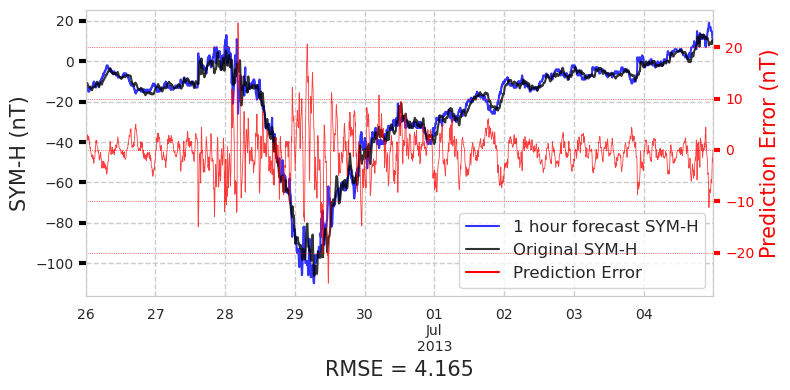

Plot for storm 41


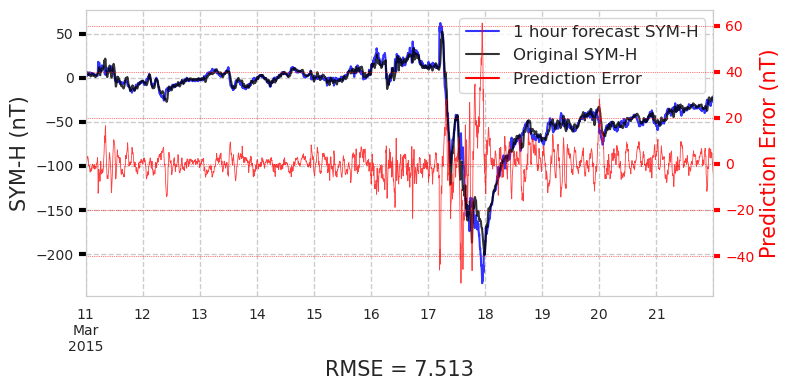

Plot for storm 42


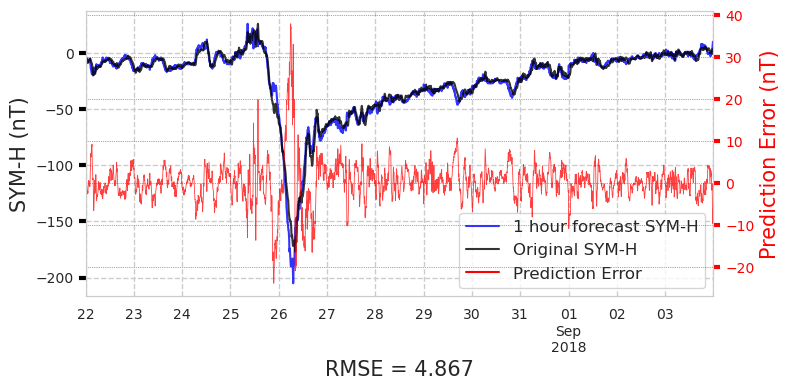

Plot for storm 26


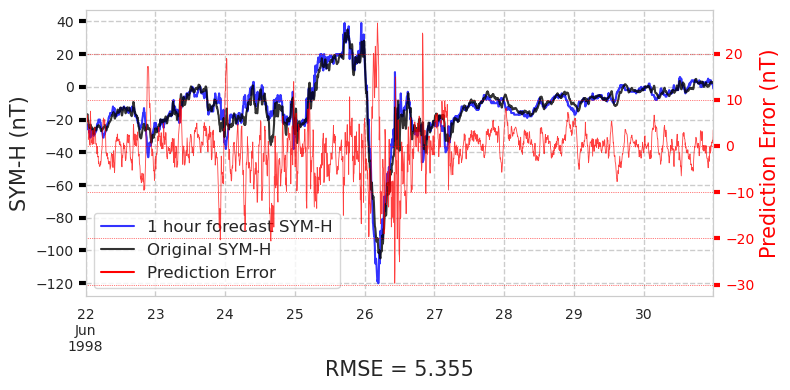

Plot for storm 27


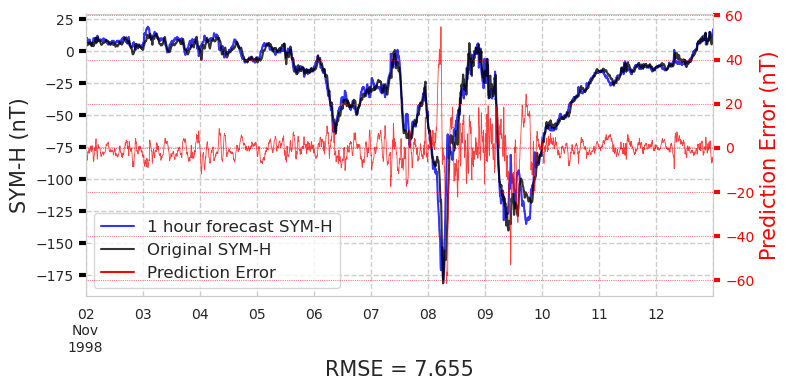

Plot for storm 28


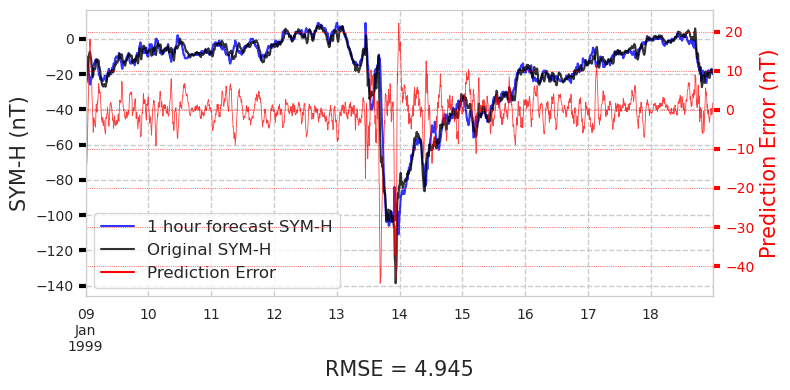

Plot for storm 29


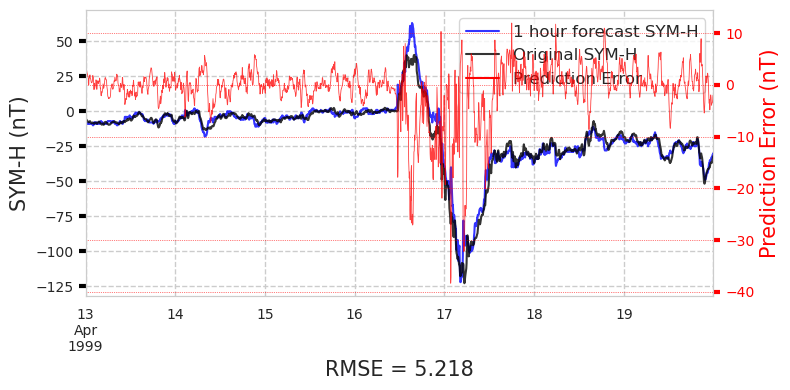

Plot for storm 30


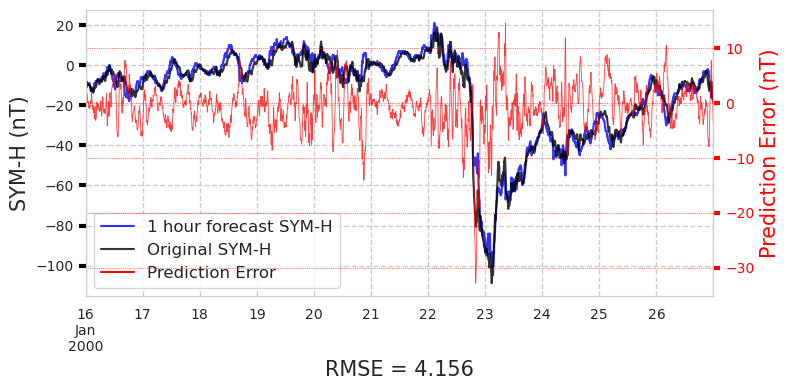

Plot for storm 31


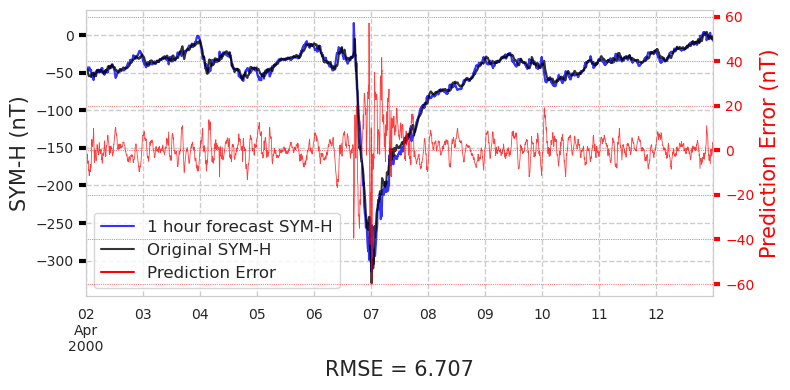

Plot for storm 32


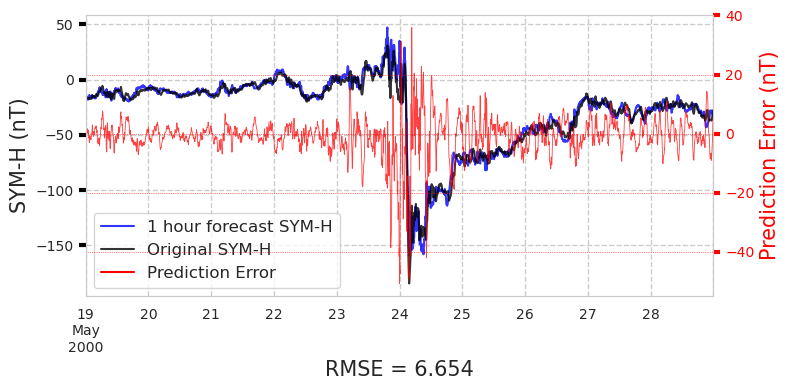

Plot for storm 33


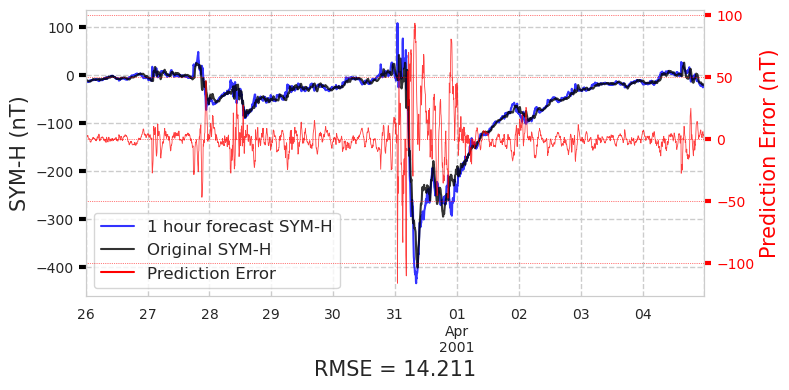

Plot for storm 34


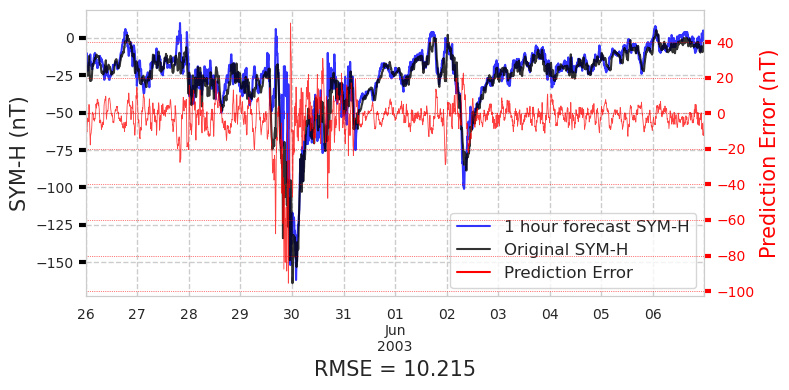

Plot for storm 35


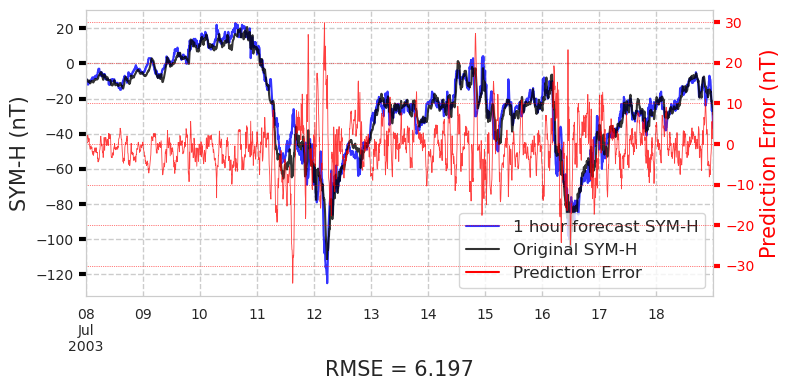

Plot for storm 36


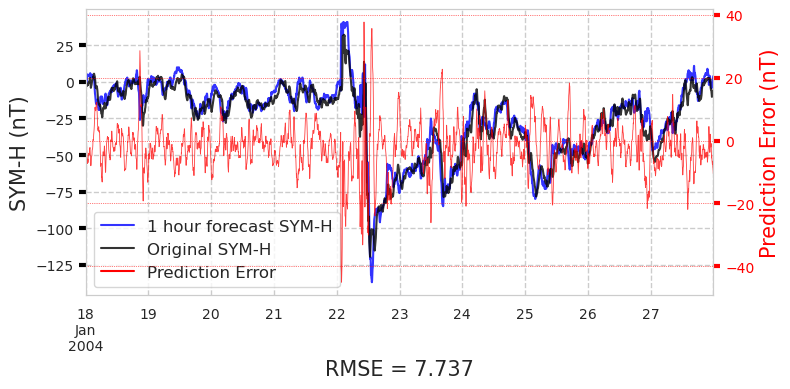

Plot for storm 37


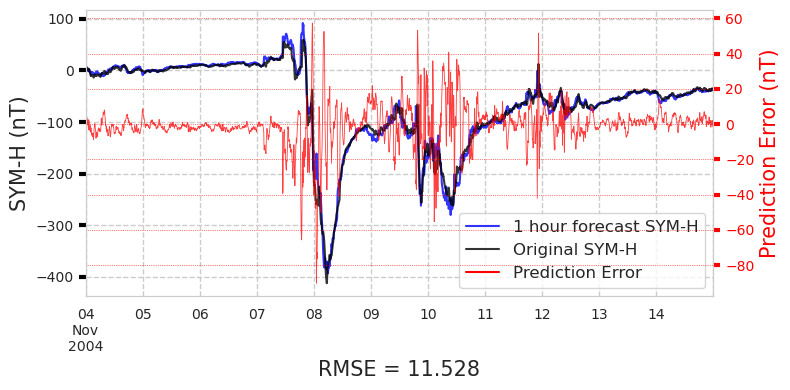

Plot for storm 38


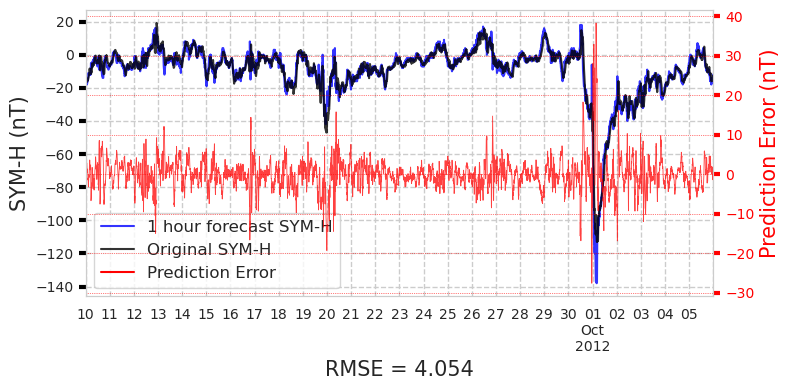

Plot for storm 39


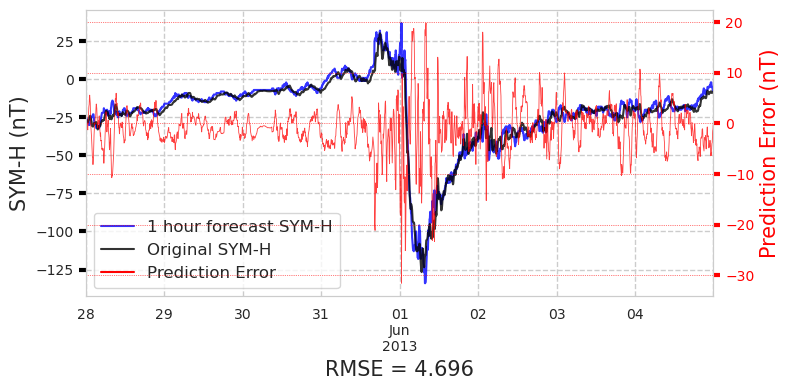

Plot for storm 40


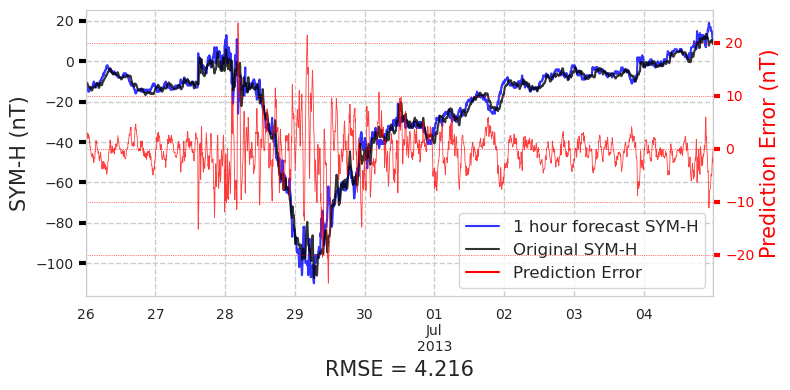

Plot for storm 41


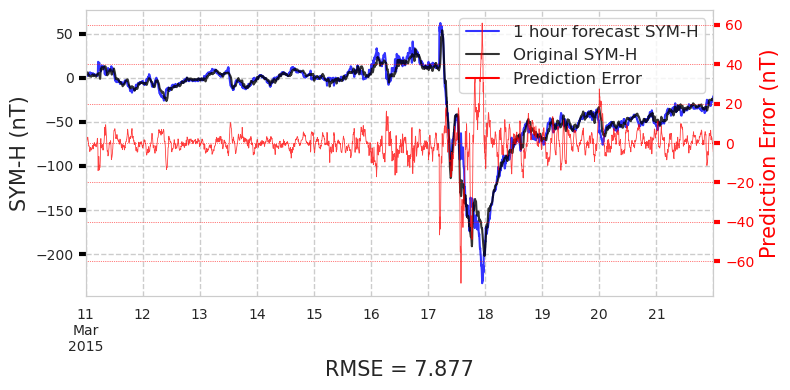

Plot for storm 42


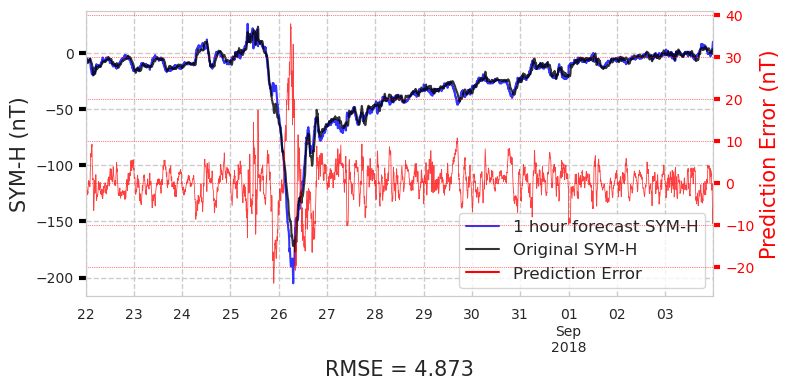

Plot for storm 26


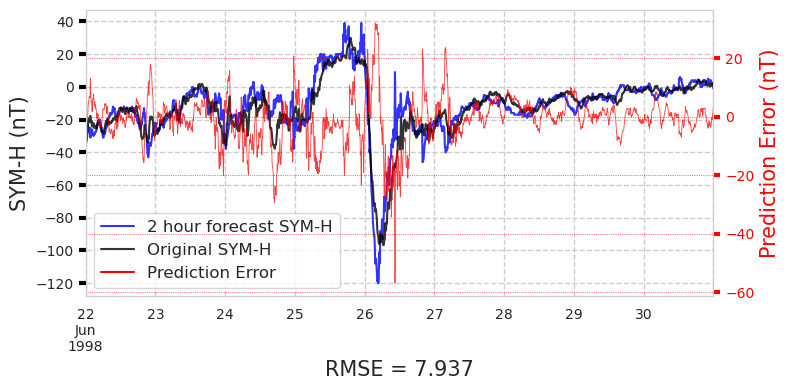

Plot for storm 27


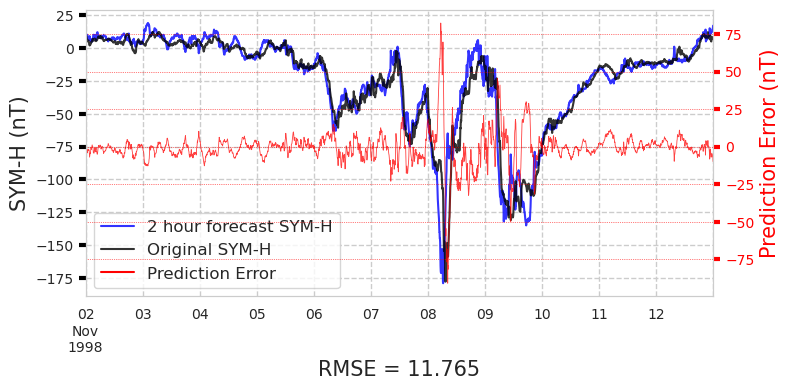

Plot for storm 28


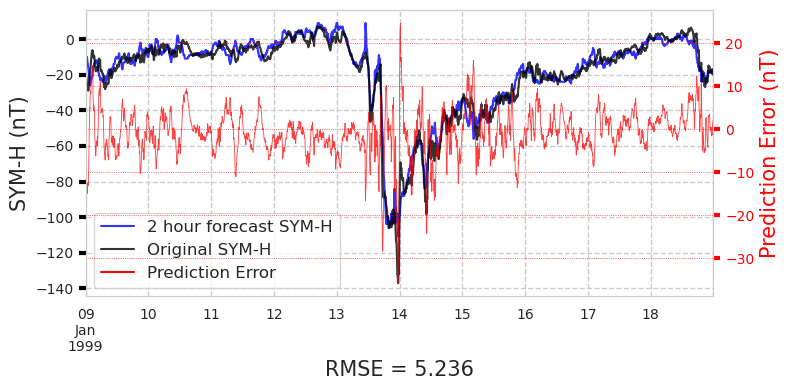

Plot for storm 29


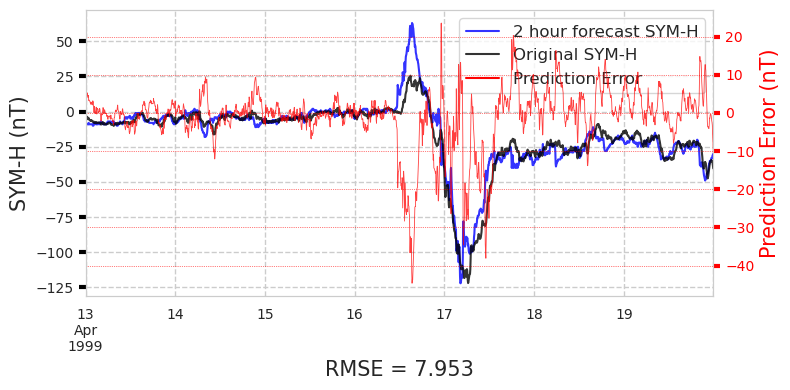

Plot for storm 30


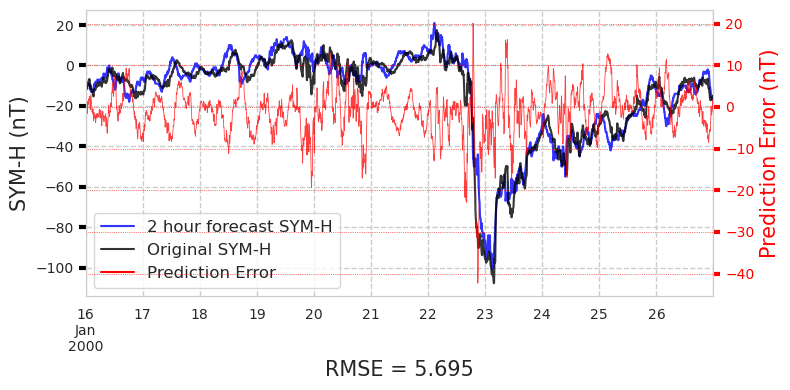

Plot for storm 31


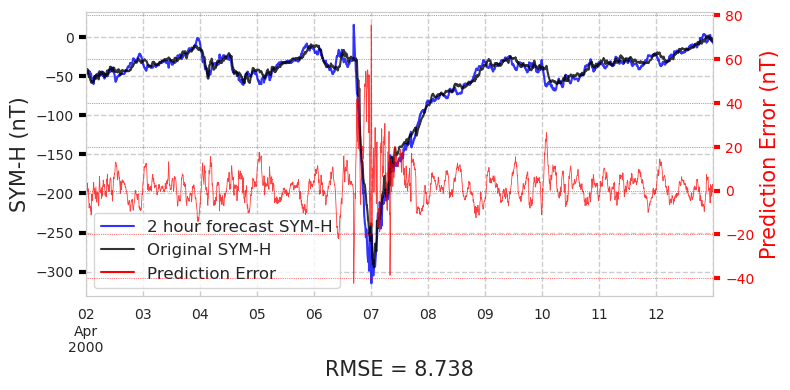

Plot for storm 32


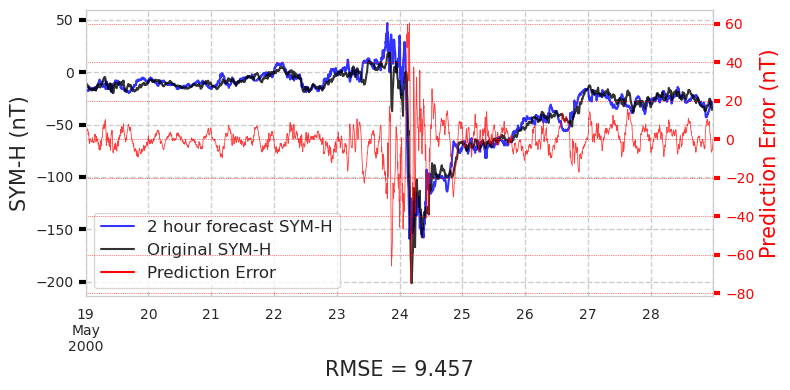

Plot for storm 33


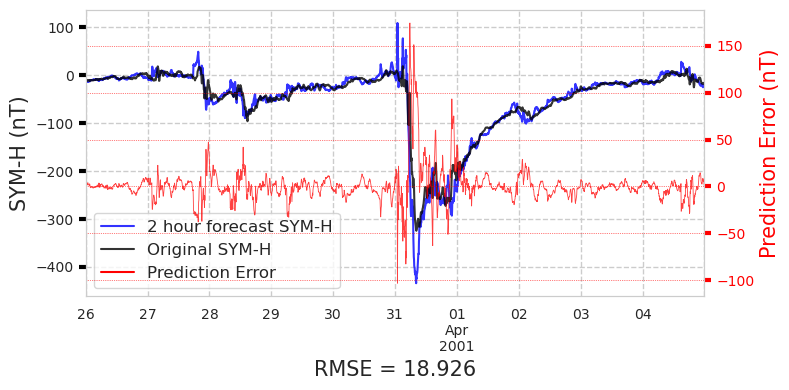

Plot for storm 34


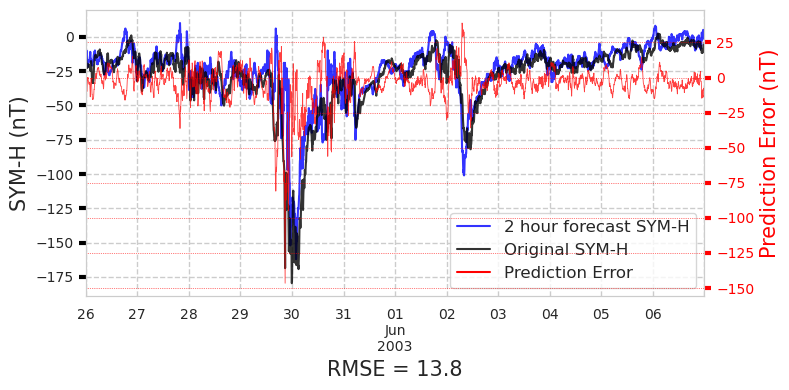

Plot for storm 35


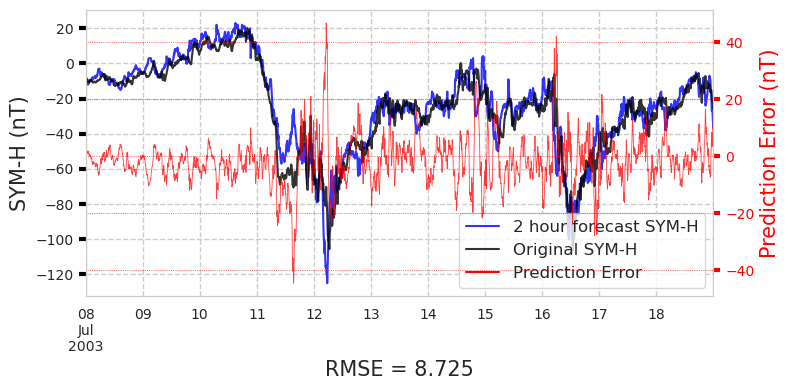

Plot for storm 36


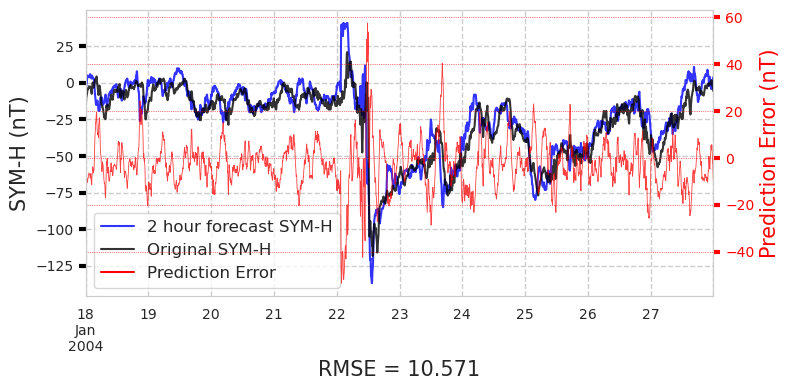

Plot for storm 37


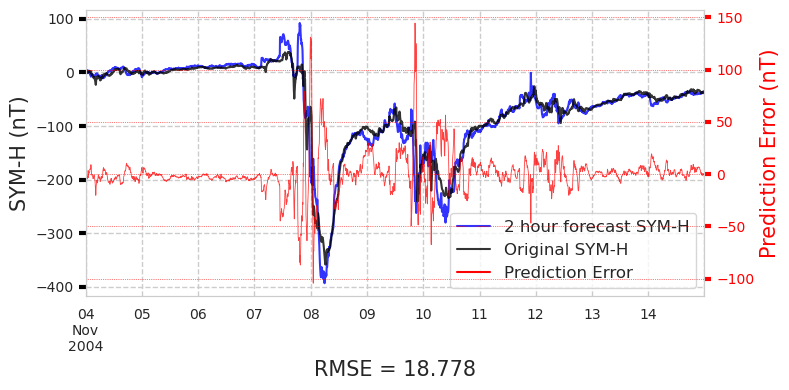

Plot for storm 38


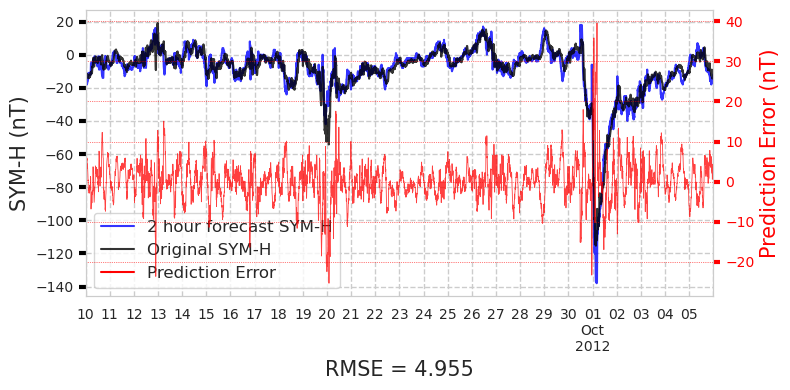

Plot for storm 39


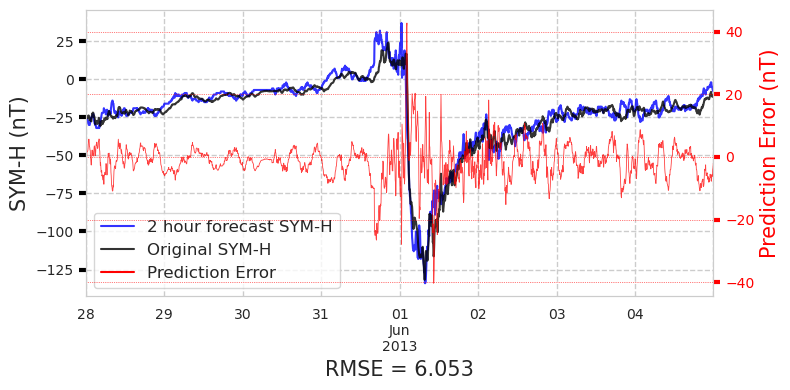

Plot for storm 40


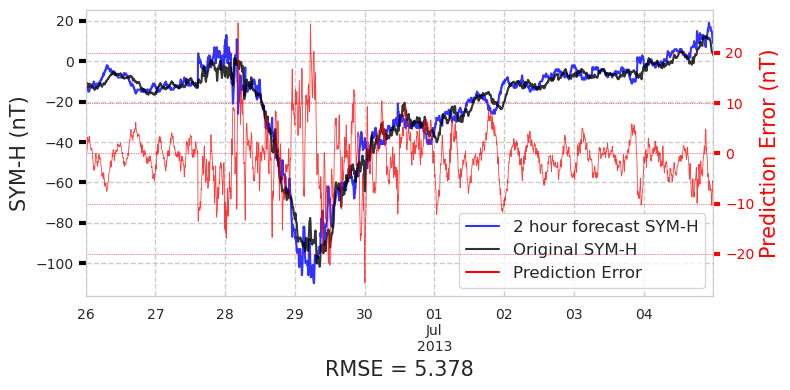

Plot for storm 41


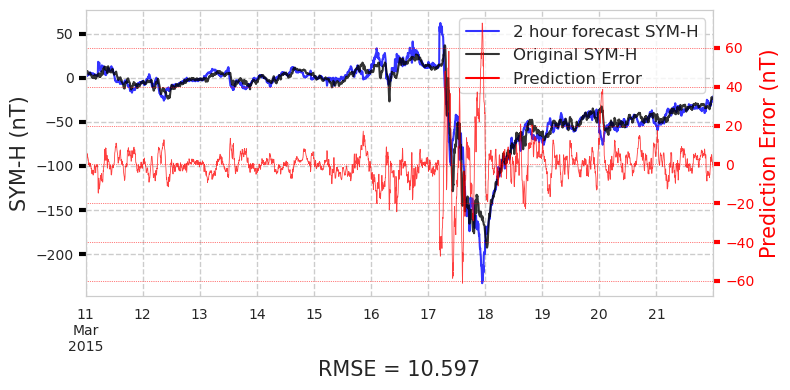

Plot for storm 42


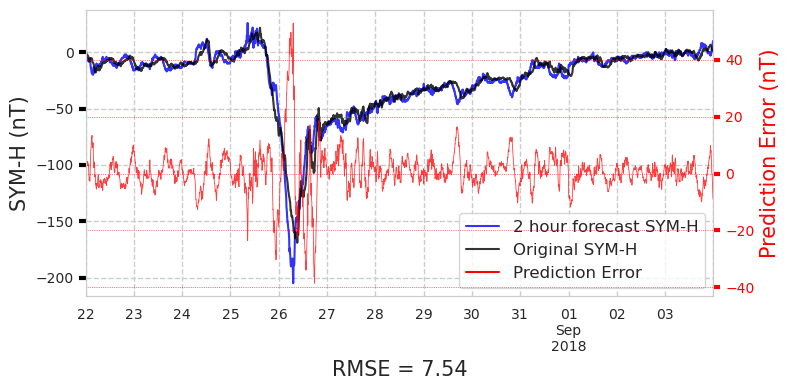

Plot for storm 26


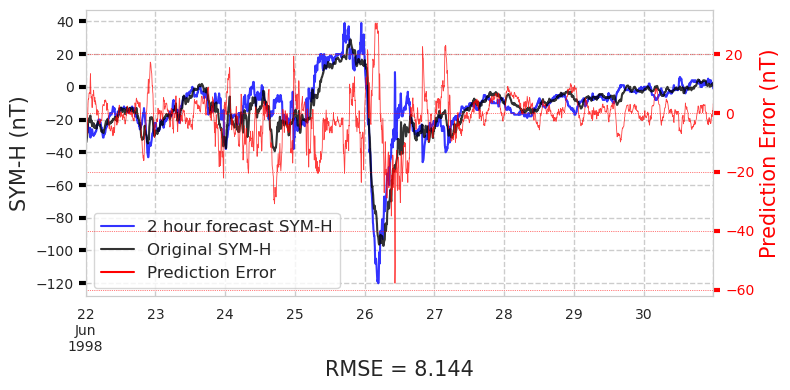

Plot for storm 27


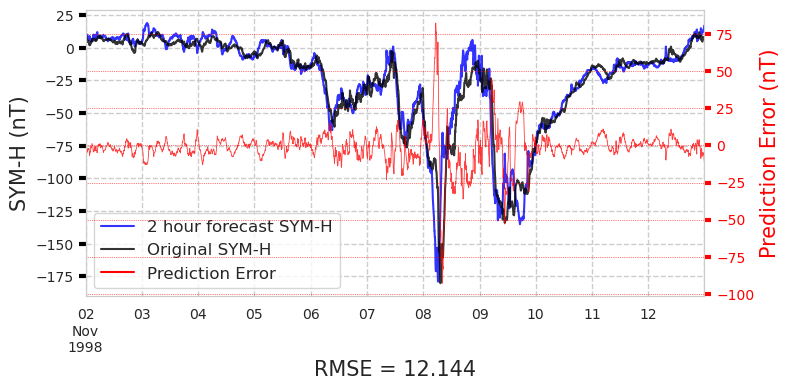

Plot for storm 28


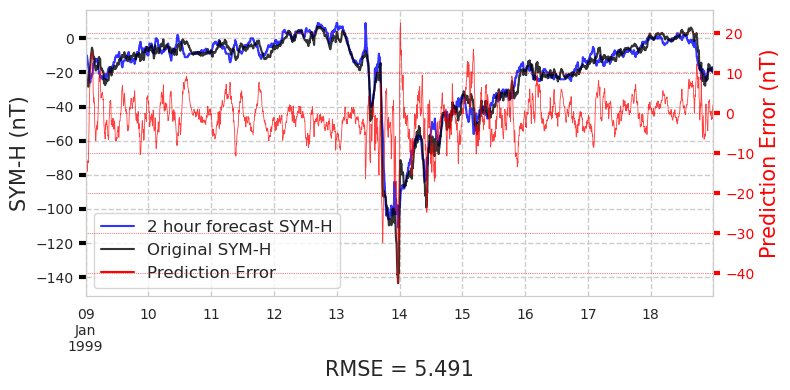

Plot for storm 29


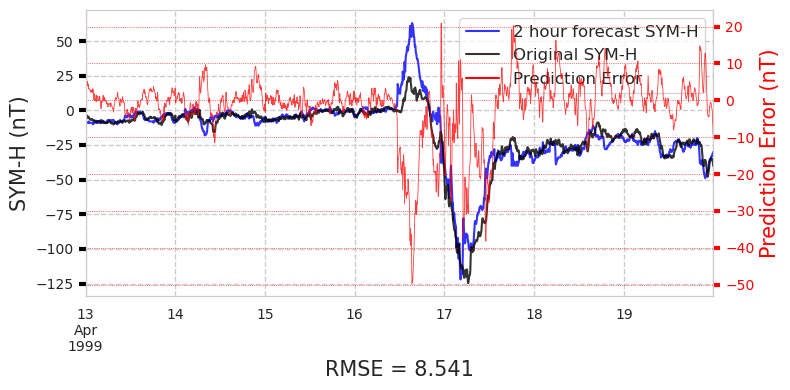

Plot for storm 30


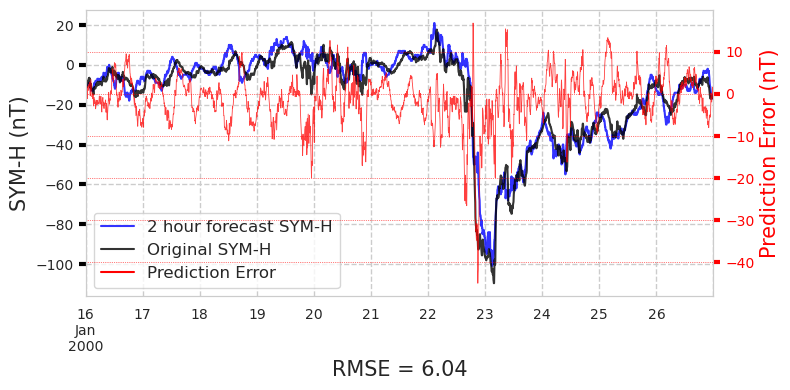

Plot for storm 31


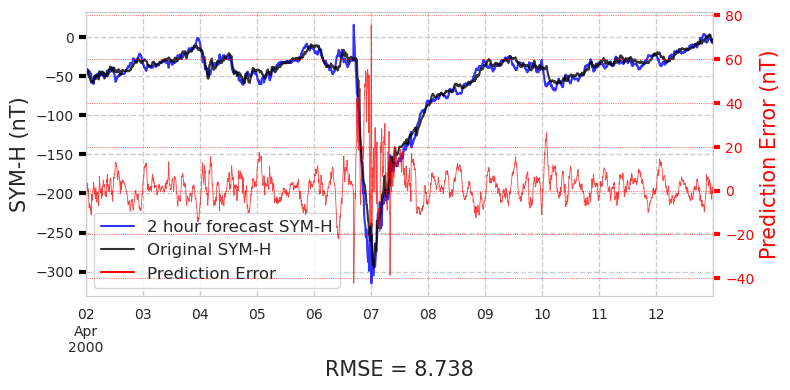

Plot for storm 32


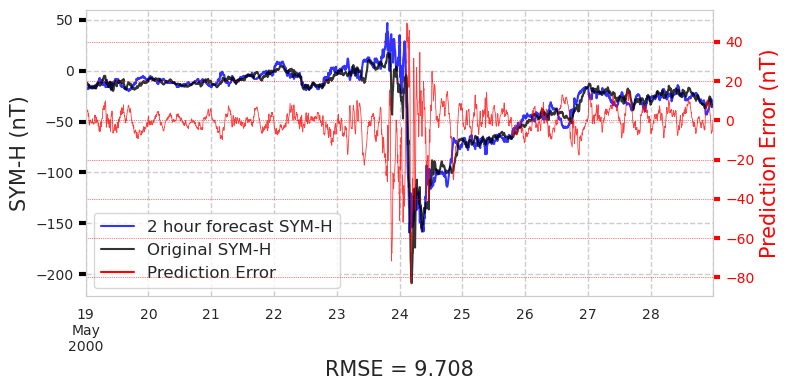

Plot for storm 33


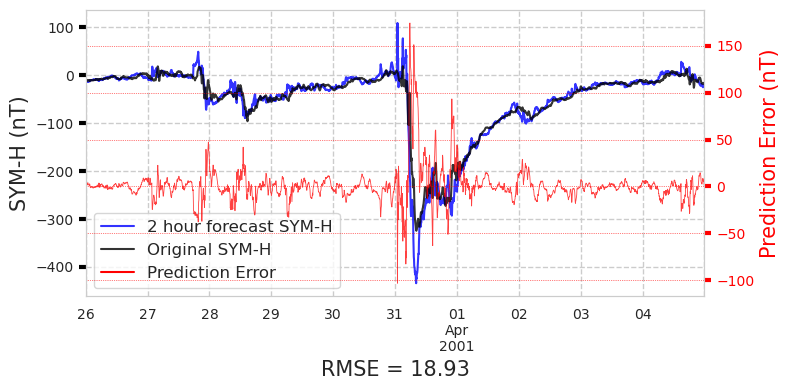

Plot for storm 34


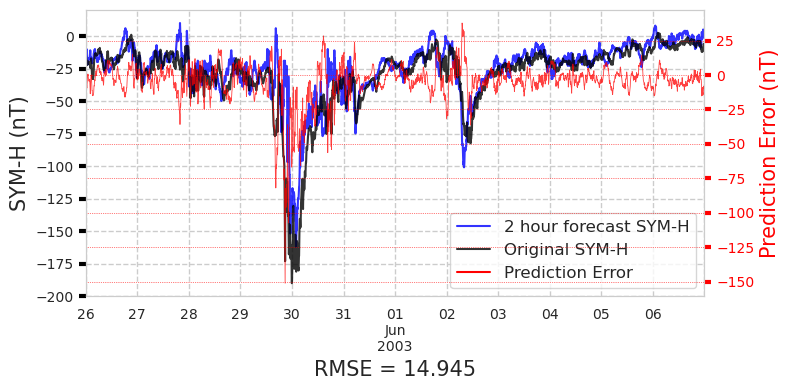

Plot for storm 35


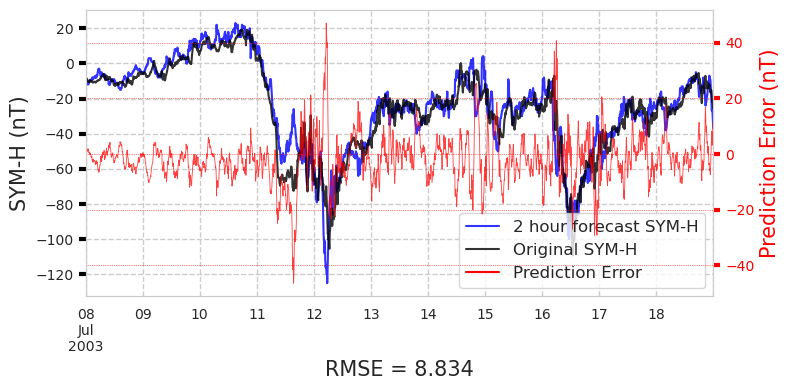

Plot for storm 36


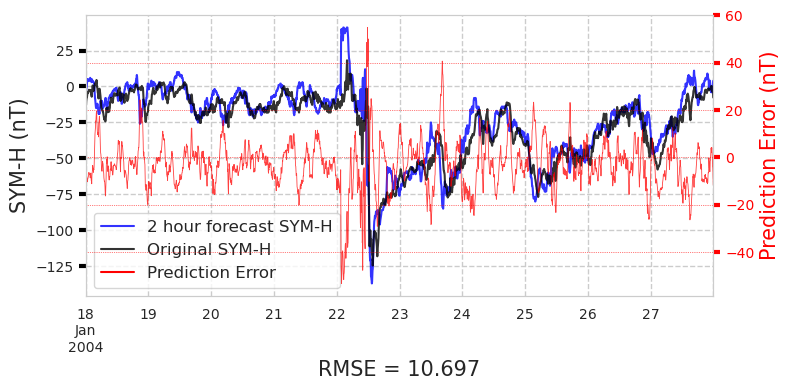

Plot for storm 37


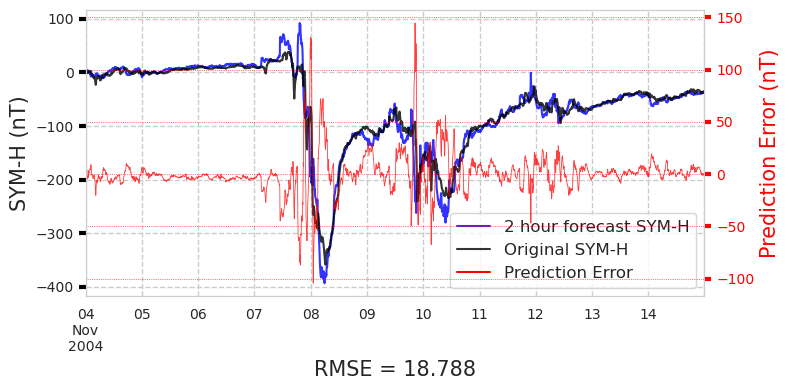

Plot for storm 38


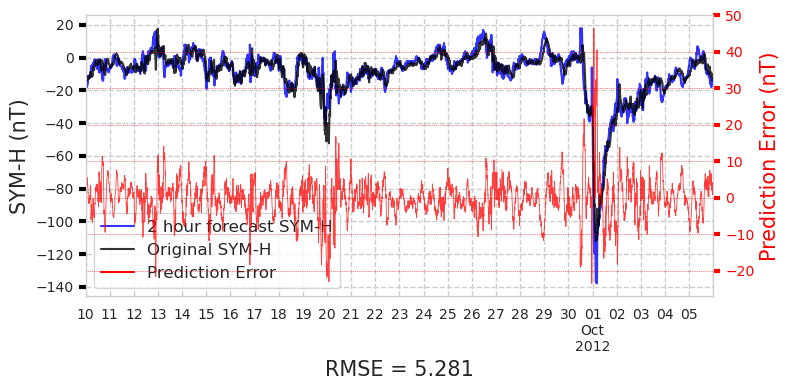

Plot for storm 39


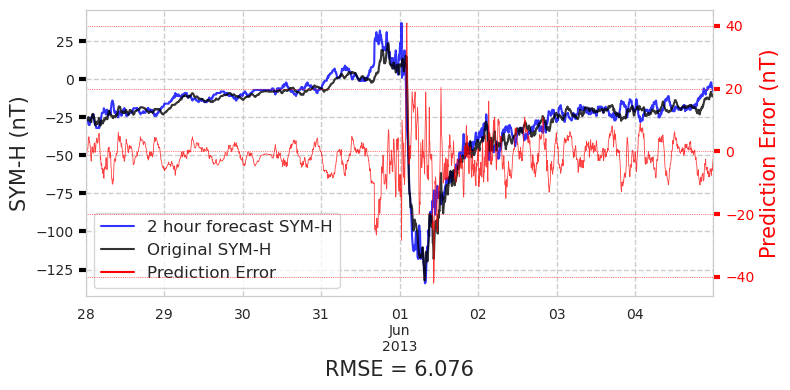

Plot for storm 40


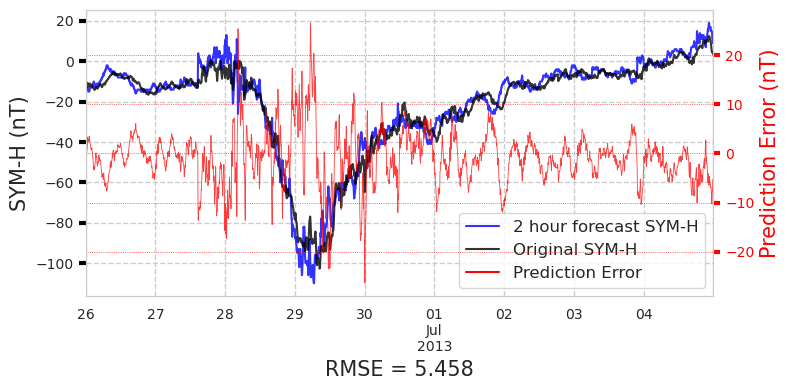

Plot for storm 41


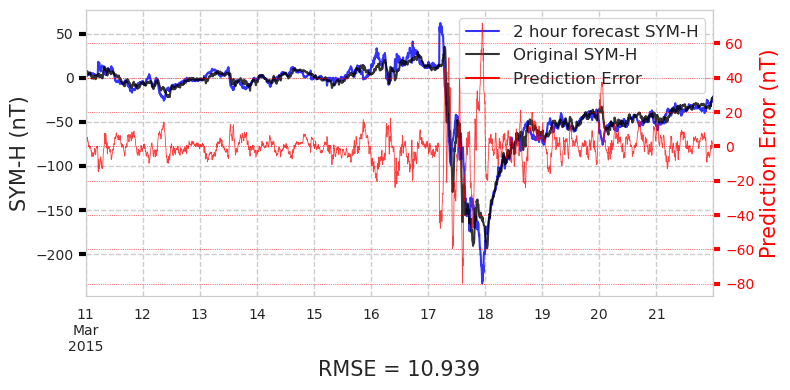

Plot for storm 42


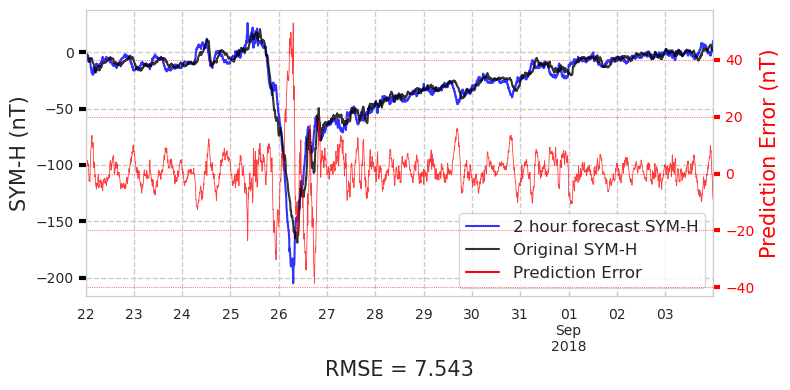

In [12]:
column_pairs = [
    (df_60_swics, 'original_SYM_H-t0', 'predicted_SYM_H_1h_swics', "1 hour forecast SYM-H", 
     '1h_swics', 'Proposed model trained with SWEPAM and SWICS'),
    (df_60_rt, 'original_SYM_H-t0', 'predicted_SYM_H_1h_real_time', "1 hour forecast SYM-H", 
     '1h_rt', 'Proposed model evaluated on real time scenario',),
    (df_120_swics, 'original_SYM_H-t0', 'predicted_SYM_H_2h_swics', "2 hour forecast SYM-H", 
     '2h_swics', 'Proposed model trained with SWEPAM and SWICS'),
    (df_120_rt, 'original_SYM_H-t0', 'predicted_SYM_H_2h_real_time', "2 hour forecast SYM-H", 
     '2h_rt', 'Proposed model evaluated on real time scenario'),
]

storm_texts = []

base_path = './supporting_information/paper_plots'
os.makedirs(base_path, exist_ok = True)

for pair_index, pair in enumerate(column_pairs):

    df_eval = pair[0].copy()
    og_col = pair[1]
    pred_col = pair[2]
    pred_title = pair[3]
    save_path = pair[4]
    plot_title = pair[5]

    os.makedirs(os.path.join(base_path, save_path), exist_ok = True)

    for i, storm_index in enumerate(storm_indices):

        print(f'Plot for storm {storm_index}')

        df = df_eval[TEST_STORM_STARTS[i] : TEST_STORM_ENDS[i]].copy()        

        fig, ax = plt.subplots(1, 1, figsize = (8, 4))
        lin_pred = df[og_col].plot(ax = ax, color = "blue", label = pred_title, alpha = 0.8)
        lin_og = df[pred_col].plot(ax = ax, color = "black", label = "Original SYM-H", alpha = 0.8)
        ax.grid(True, linestyle="--", axis="both", which="both", linewidth=1)
        ax.tick_params(axis="y", color="black", labelsize=10, width=3, length=5)
        ax.tick_params(axis="x", color="black", which = 'both', labelsize=10, width=3, length=5)
        ax.set_ylabel('SYM-H (nT)', fontsize = 15)
        mse = np.round(msem(df[pred_col], df[og_col], squared = False), 3)
        ax.set_xlabel(f'RMSE = {mse}', fontsize = 15)
        
        if pair_index == 0:
            storm_texts.append(f'Storm Number {storm_index} -- {df.index[len(df) // 2].month_name()} of {df.index[len(df) // 2].year}')
            
        twin = ax.twinx()

        df['diff'] = df[pred_col] - df[og_col]
        df['diff'].plot(ax = twin, color = 'red', linewidth = 0.6, alpha = 0.75, label = 'Prediction Error')

        twin.set_ylabel('Prediction Error (nT)', color = 'red', fontsize = 15)
        twin.grid(True, color="red", linestyle=":", axis="y", which="both", linewidth=0.5)
        twin.tick_params(axis="y", colors="red", labelsize=10, width=3, length=5)    
        plt.rcParams['axes.axisbelow'] = True
        
        ax.plot(0,0, color = 'red', label = 'Prediction Error')

        ax.legend(loc = 0, prop={'size':12})


        fig.tight_layout()
        fig.savefig(os.path.join(base_path, save_path, f"{save_path}_storm_{storm_index}.png"), dpi=400)
        plt.show();
        

In [13]:
for sti, storm_index in enumerate(range(26, 43)):
    print(f'% Figure for storm {storm_index}')
    
    print(f'\\begin{{table}}')
    print(f'\\centering')
    print(f'\\begin{{tabular}}{{cc}}')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/1h_swics/1h_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/2h_swics/2h_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'Model [1] & Model [2]')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/1h_no_swics/1h_no_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/2h_no_swics/2h_no_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'Model [3] & Model [4]')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/1h_swics_model_on_no_swics/1h_swics_model_on_no_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots/2h_swics_model_on_no_swics/2h_swics_model_on_no_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'Model [1] evaluated on Model [3]\'s test data & Model [2] evaluated on Model [4]\'s test data')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\end{{tabular}}')
    print(f'\\caption{{Predictions for {storm_texts[sti]}}}')
    print(f'\\label{{storm-{storm_index}}}')
    print(f'\\end{{table}}')    
    print('\n\n')

% Figure for storm 26
\begin{table}
\centering
\begin{tabular}{cc}
\includegraphics[width=0.49\linewidth]{paper_plots/1h_swics/1h_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots/2h_swics/2h_swics_storm_26.png}
\\
Model [1] & Model [2]
\vspace*{12pt}
\\
\includegraphics[width=0.49\linewidth]{paper_plots/1h_no_swics/1h_no_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots/2h_no_swics/2h_no_swics_storm_26.png}
\\
Model [3] & Model [4]
\vspace*{12pt}
\\
\includegraphics[width=0.49\linewidth]{paper_plots/1h_swics_model_on_no_swics/1h_swics_model_on_no_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots/2h_swics_model_on_no_swics/2h_swics_model_on_no_swics_storm_26.png}
\\
Model [1] evaluated on Model [3]'s test data & Model [2] evaluated on Model [4]'s test data
\vspace*{12pt}
\\
\end{tabular}
\caption{Predictions for Storm Number 26 -- June of 1998}
\label{storm-26}
\end{table}



% Figure for storm 27
\begin{table}
\cente

Plot for storm 26


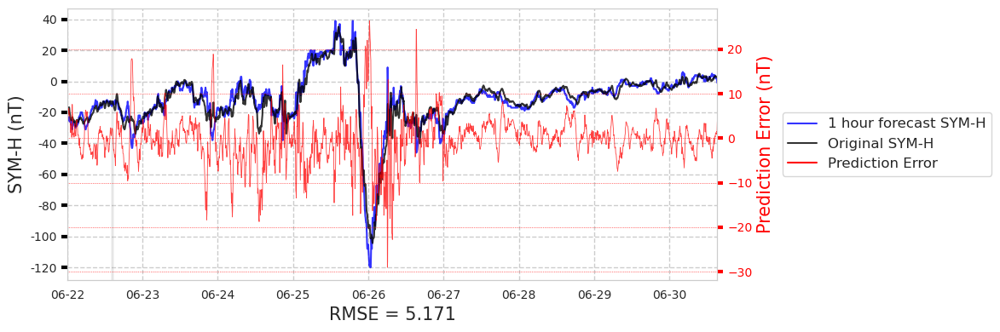

Plot for storm 27


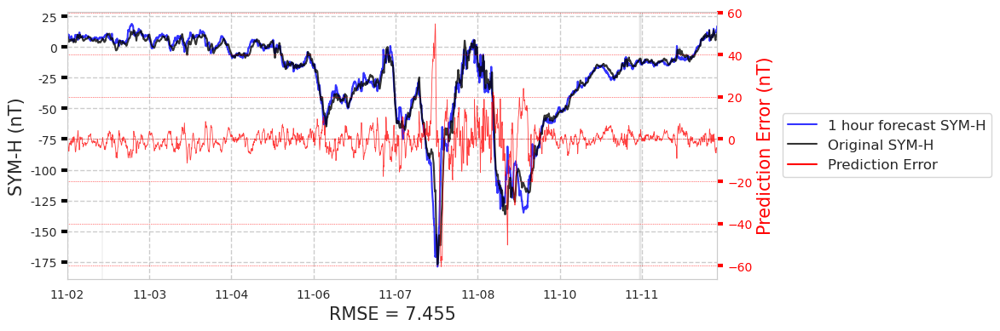

Plot for storm 28


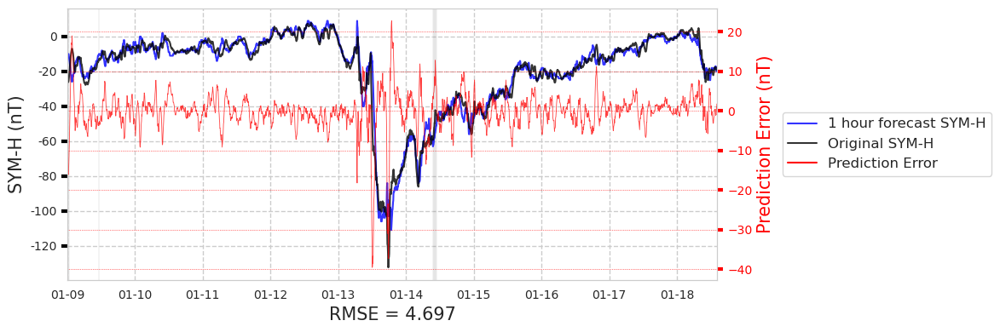

Plot for storm 29


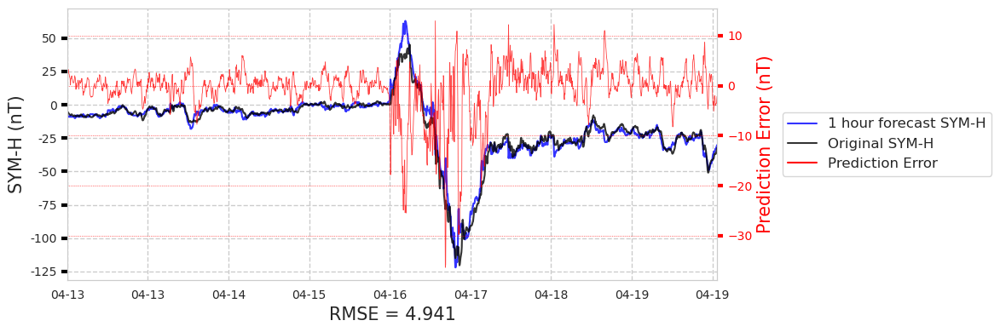

Plot for storm 30


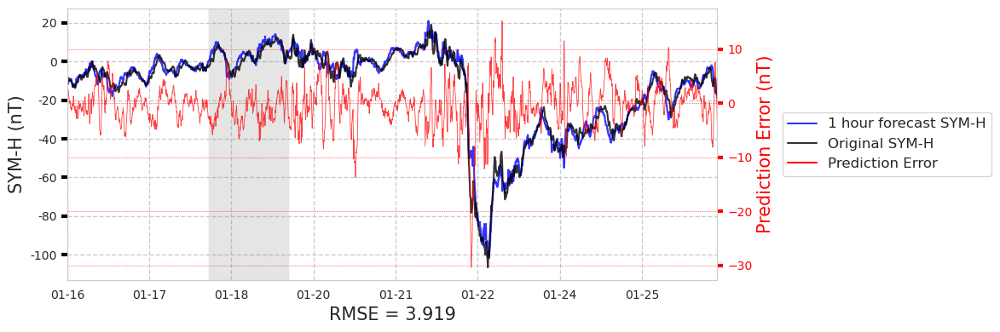

Plot for storm 31


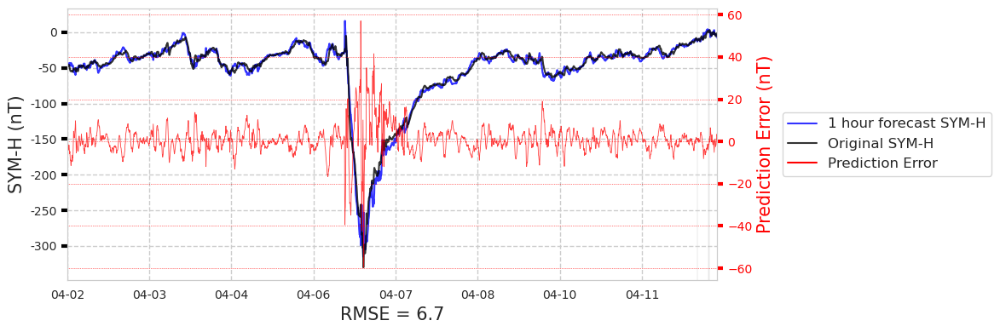

Plot for storm 32


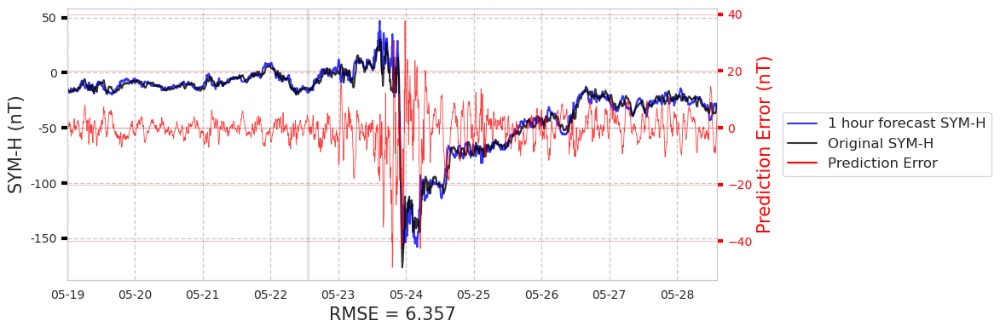

Plot for storm 33


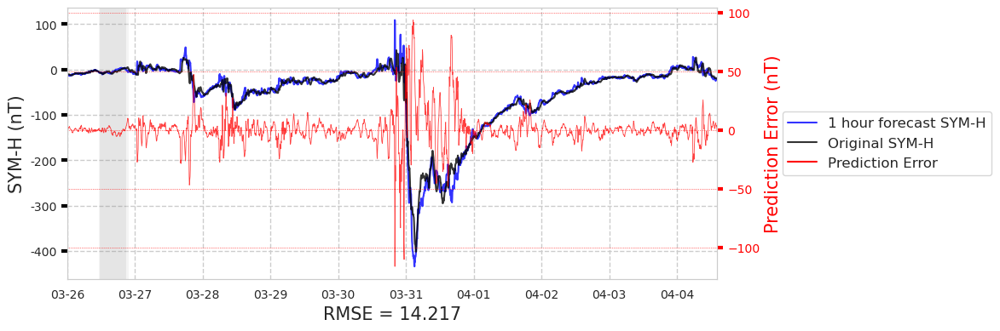

Plot for storm 34


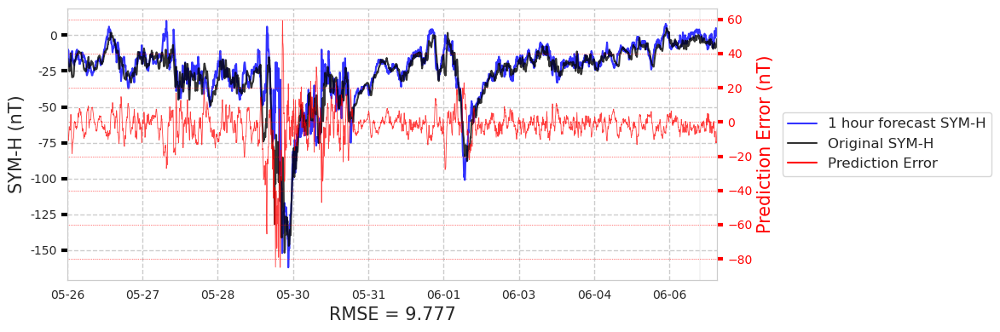

Plot for storm 35


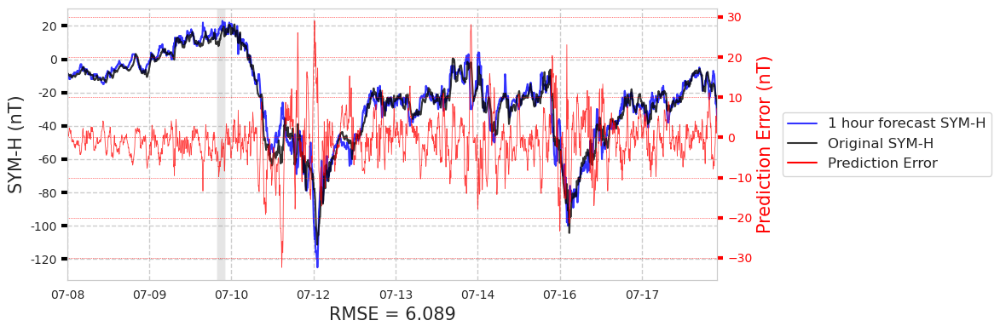

Plot for storm 36


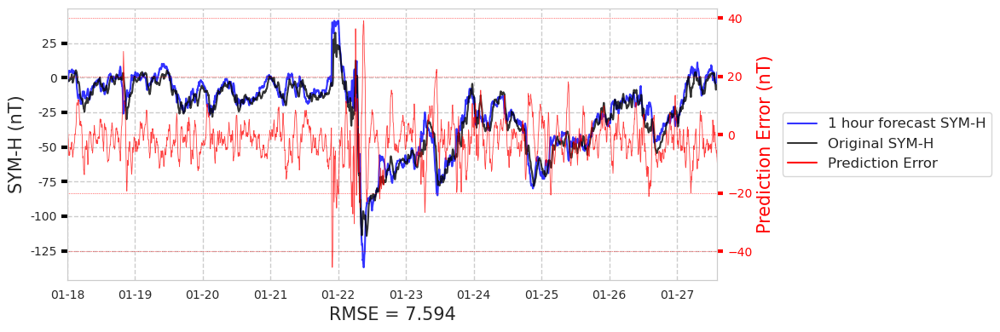

Plot for storm 37


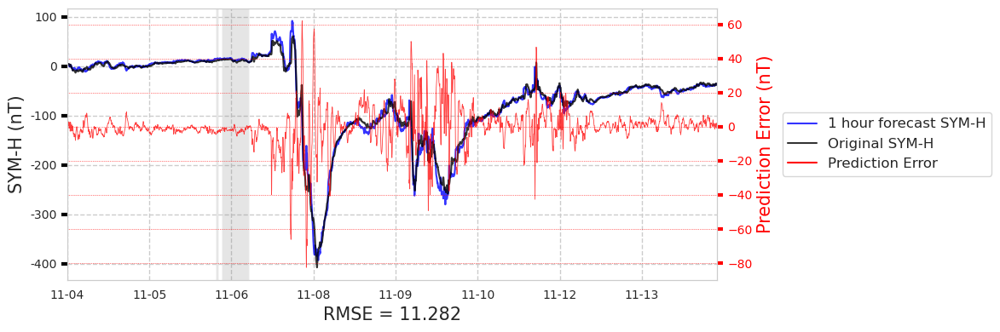

Plot for storm 38


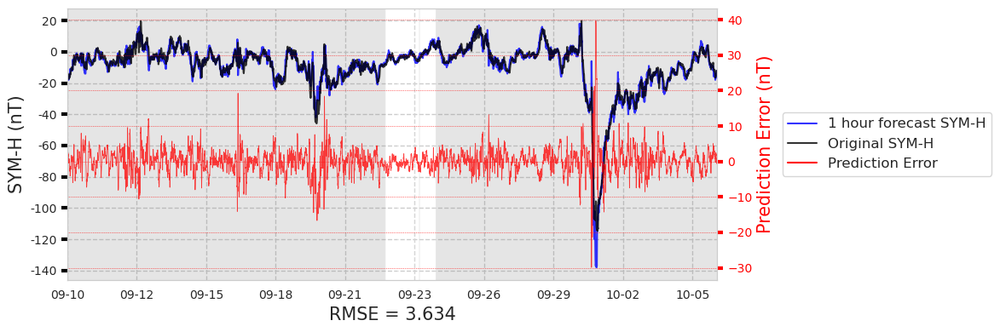

Plot for storm 39


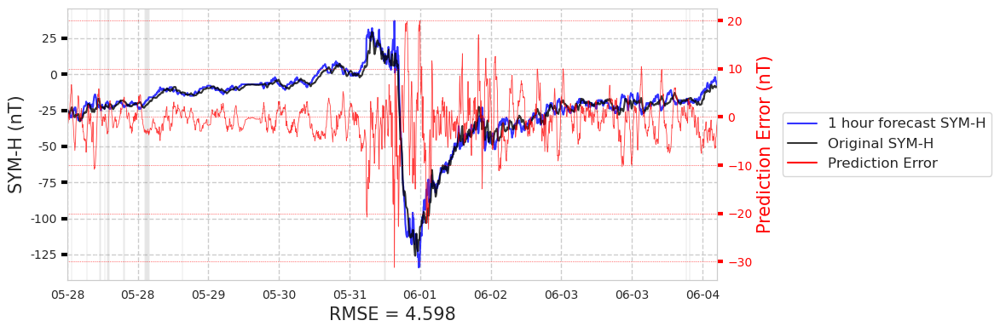

Plot for storm 40


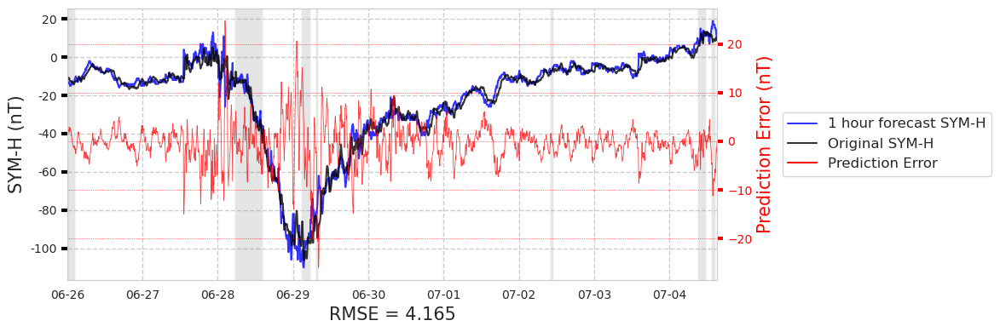

Plot for storm 41


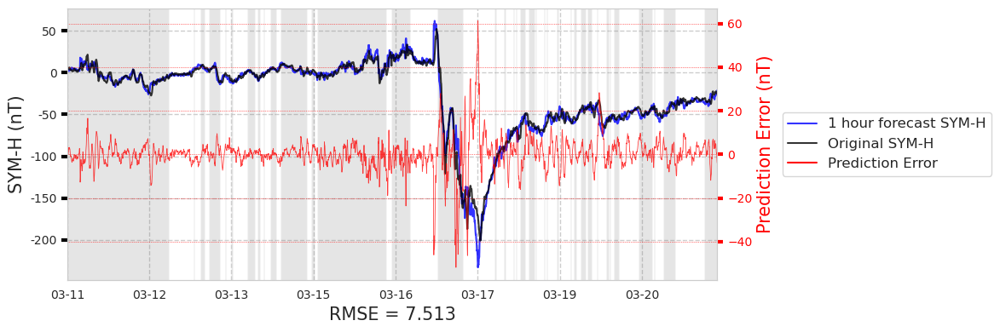

Plot for storm 42


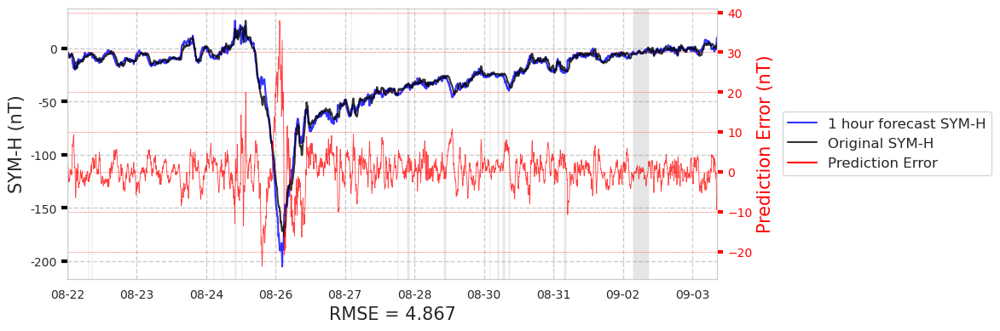

Plot for storm 26


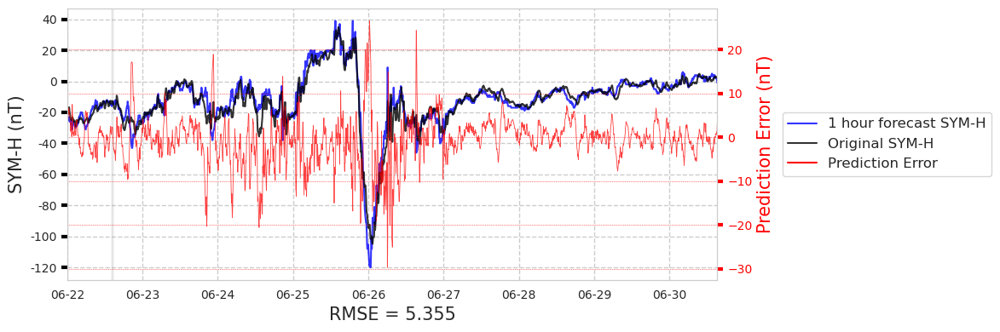

Plot for storm 27


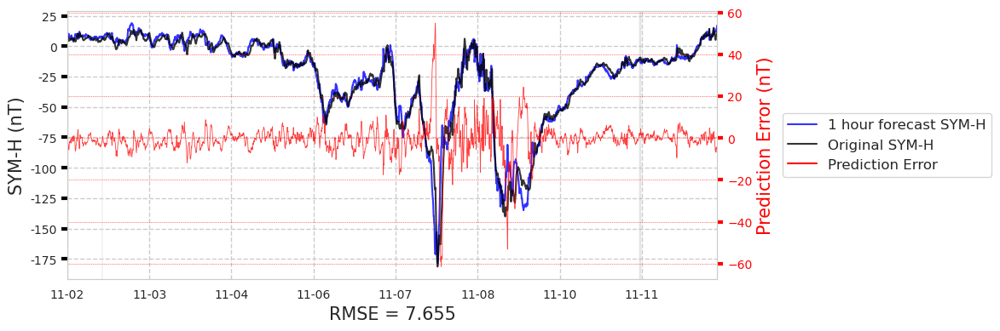

Plot for storm 28


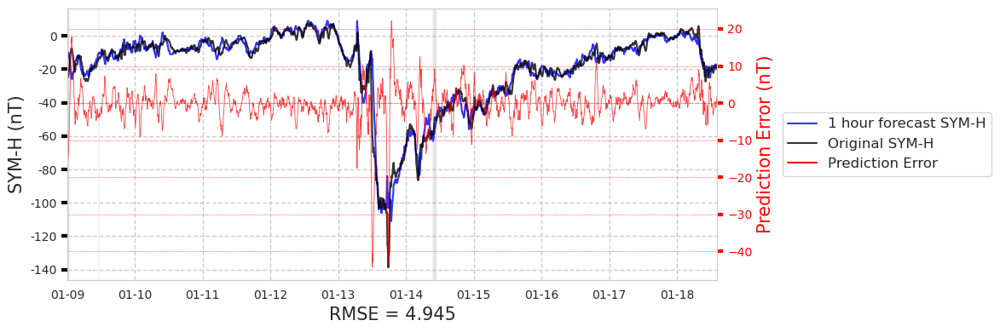

Plot for storm 29


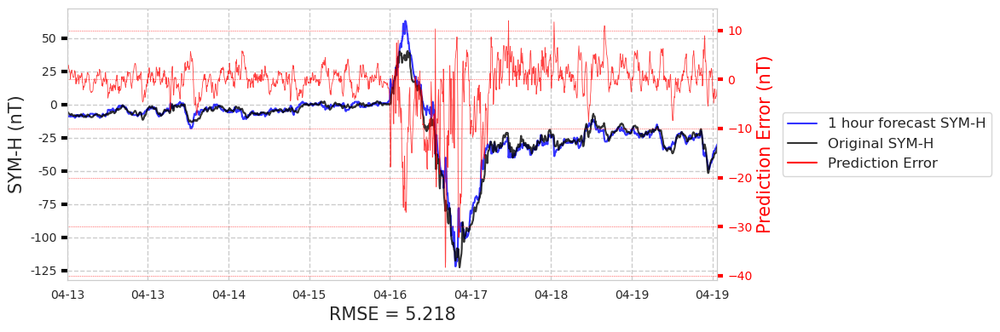

Plot for storm 30


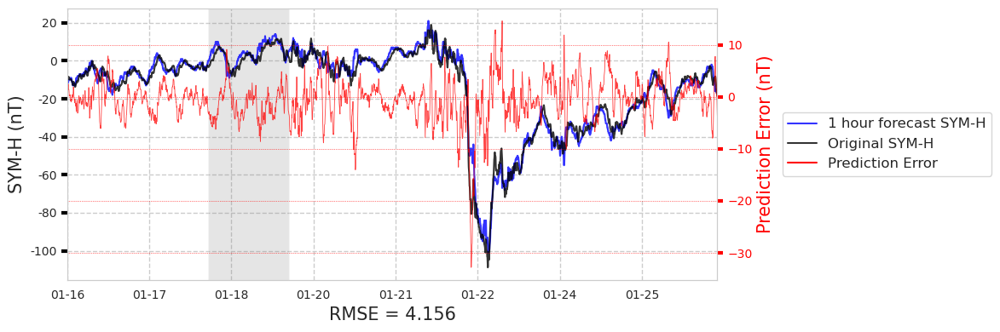

Plot for storm 31


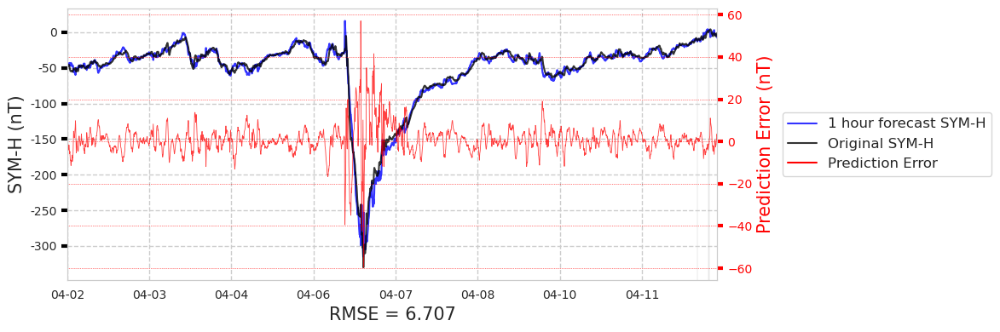

Plot for storm 32


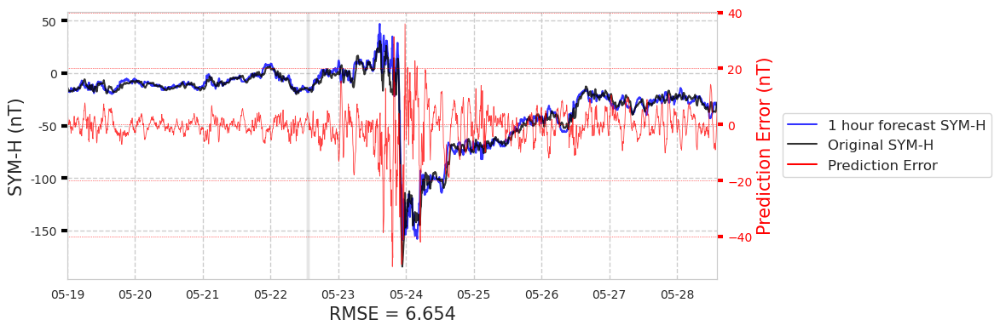

Plot for storm 33


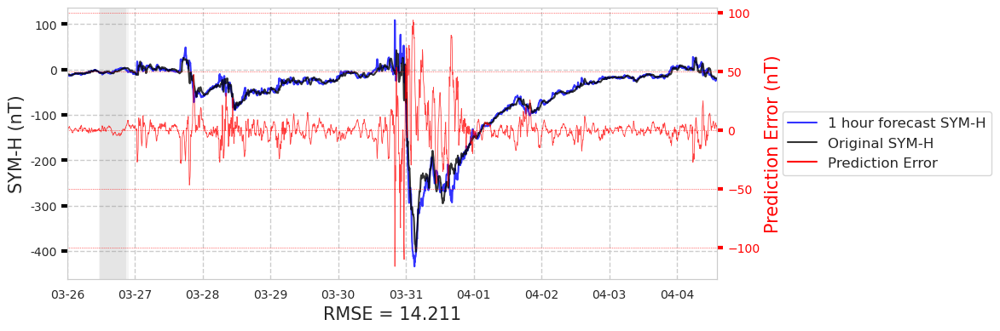

Plot for storm 34


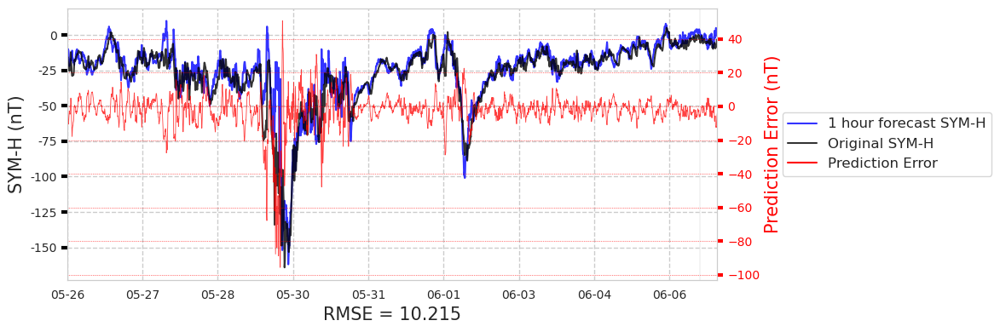

Plot for storm 35


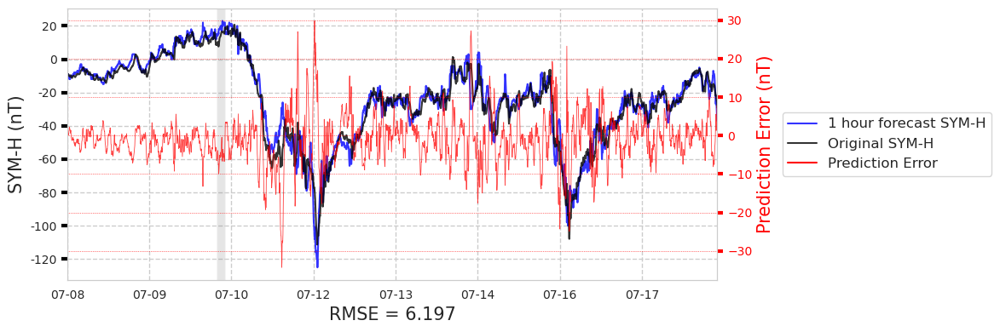

Plot for storm 36


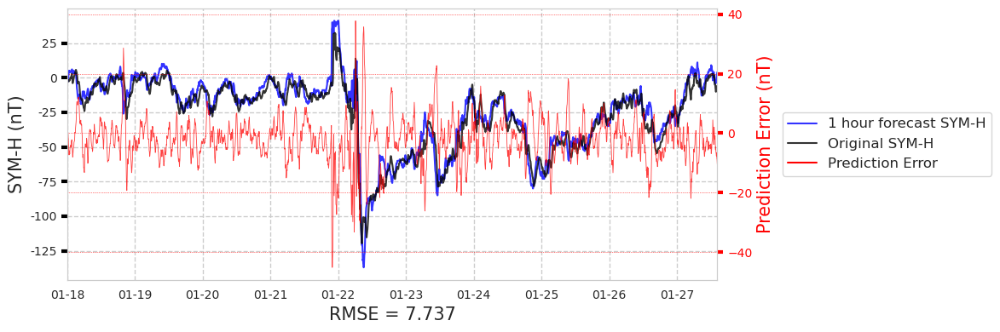

Plot for storm 37


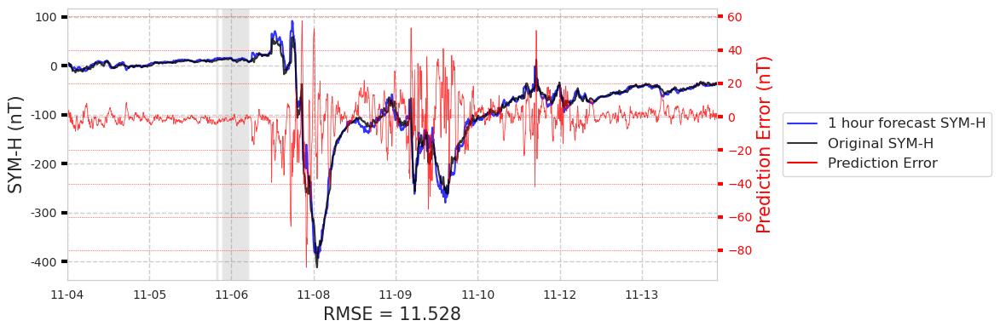

Plot for storm 38


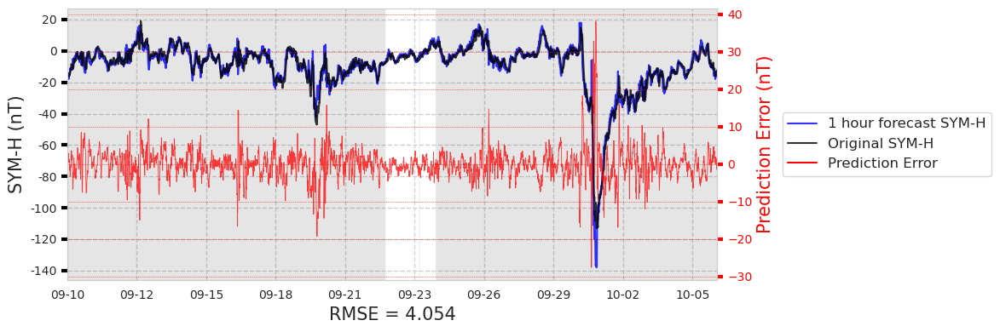

Plot for storm 39


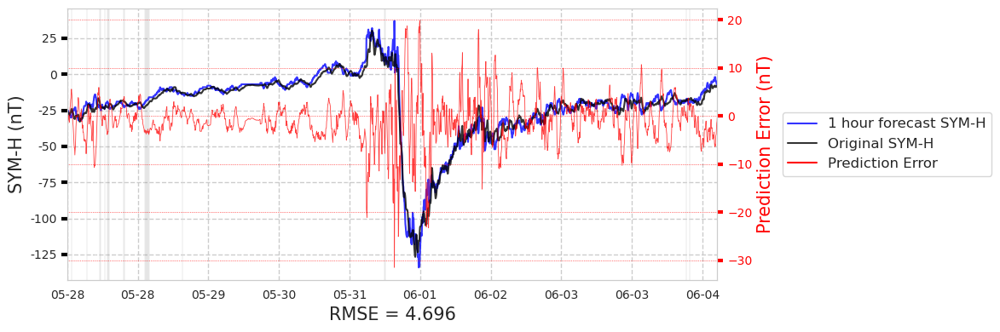

Plot for storm 40


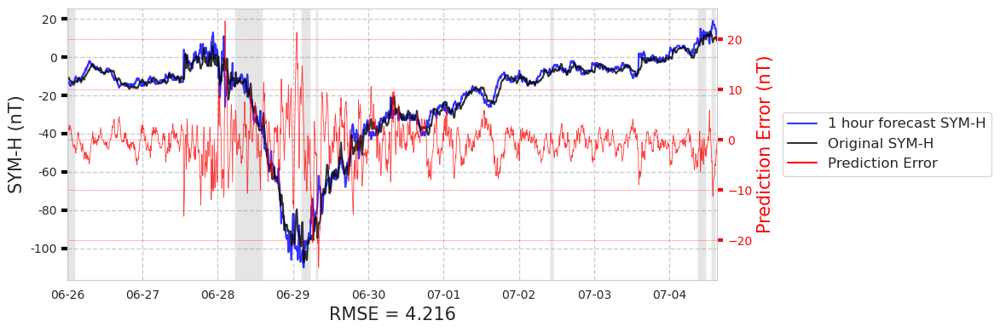

Plot for storm 41


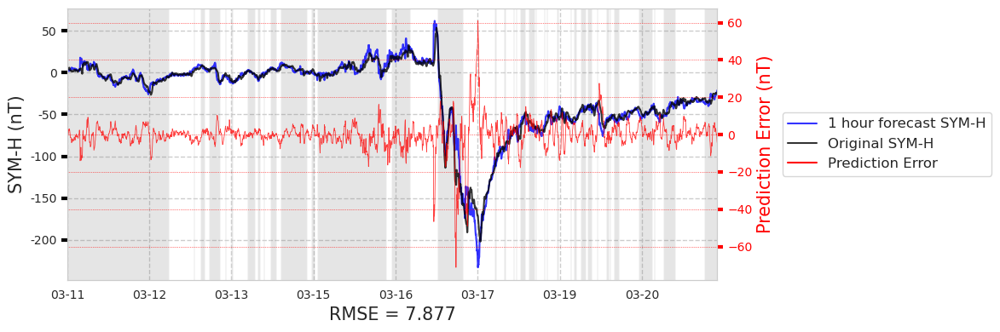

Plot for storm 42


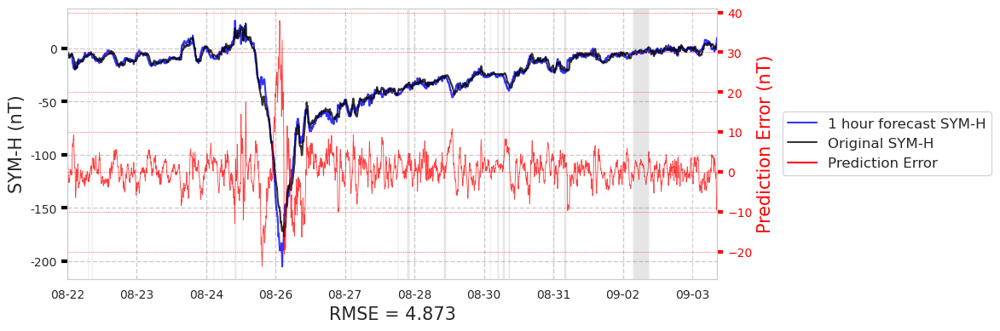

Plot for storm 26


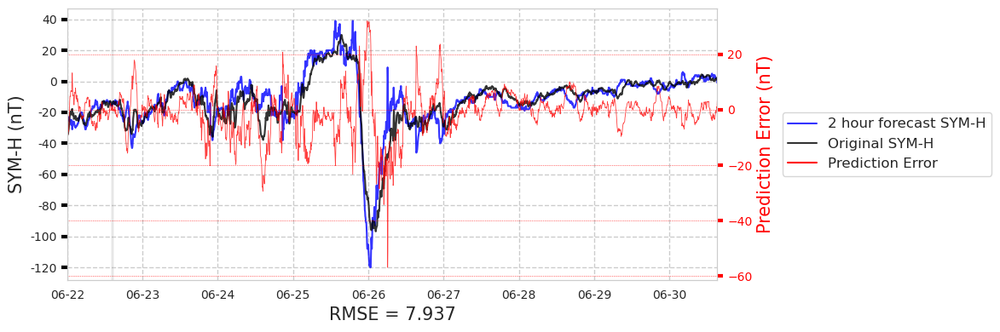

Plot for storm 27


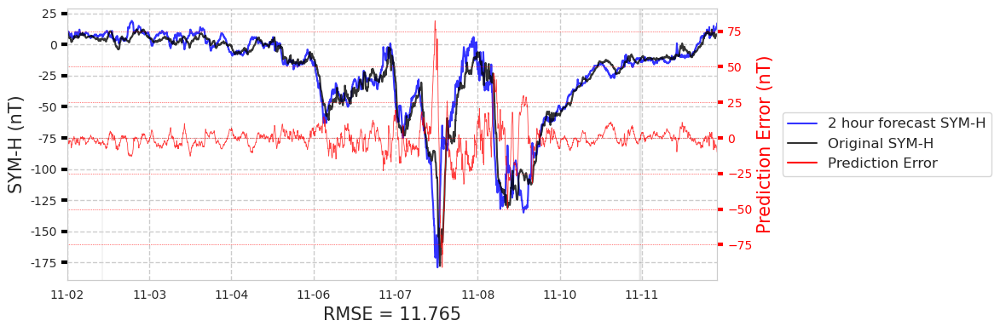

Plot for storm 28


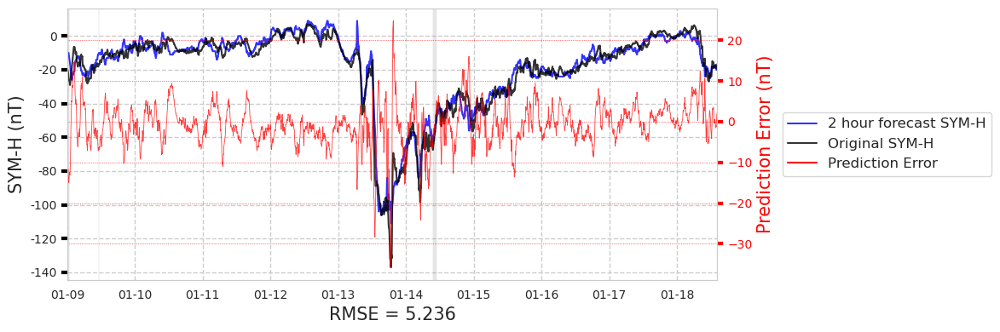

Plot for storm 29


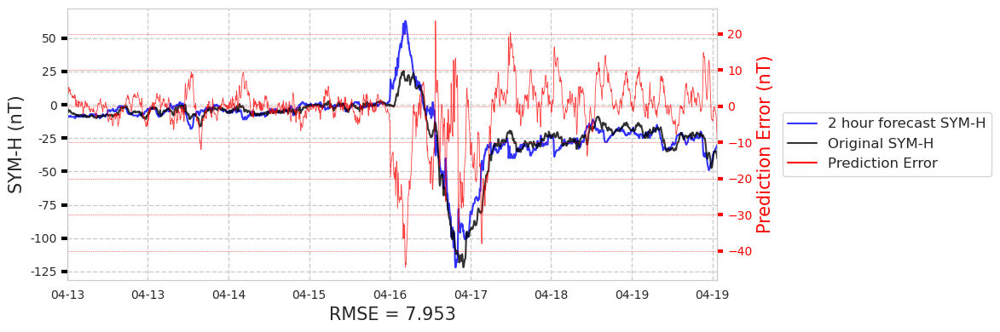

Plot for storm 30


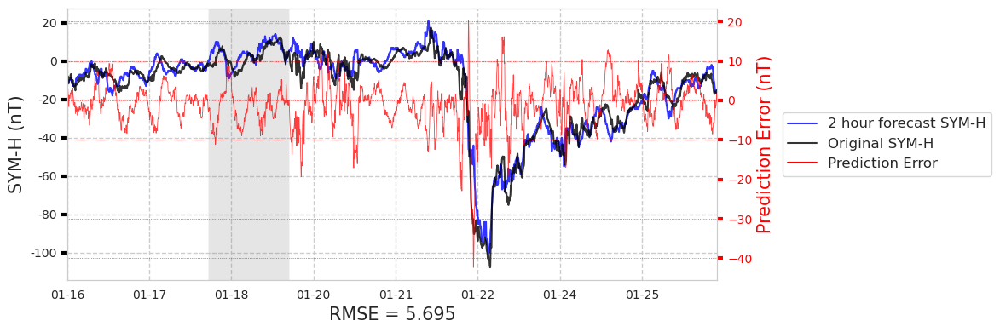

Plot for storm 31


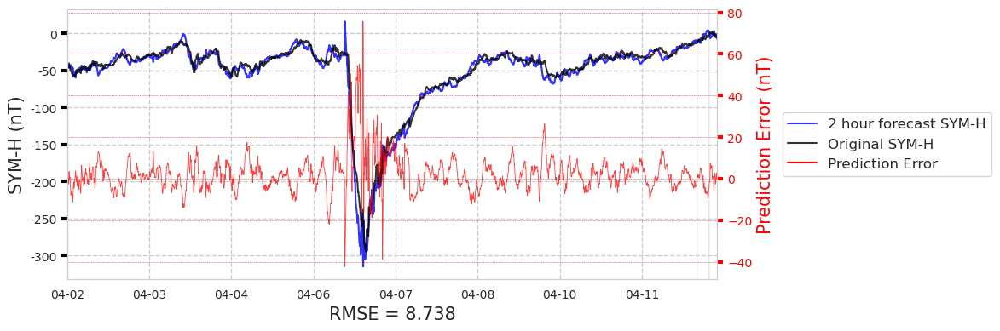

Plot for storm 32


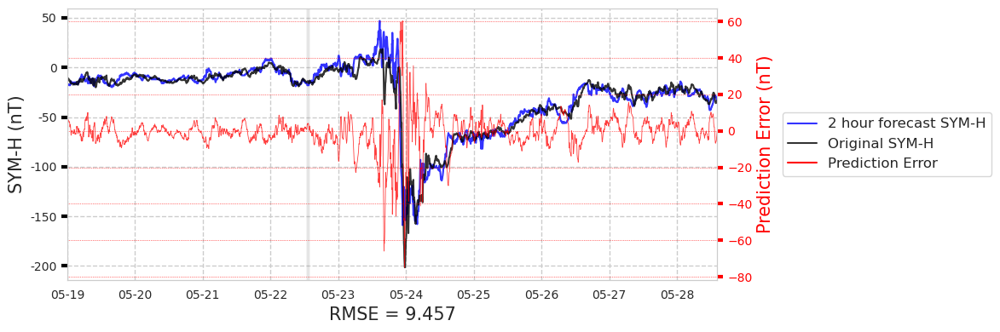

Plot for storm 33


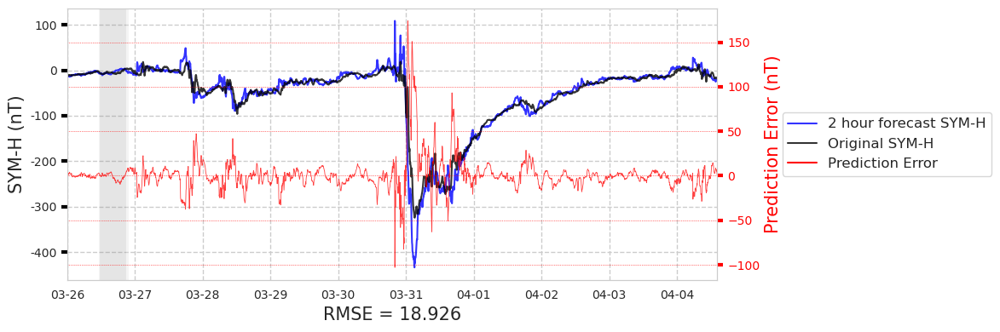

Plot for storm 34


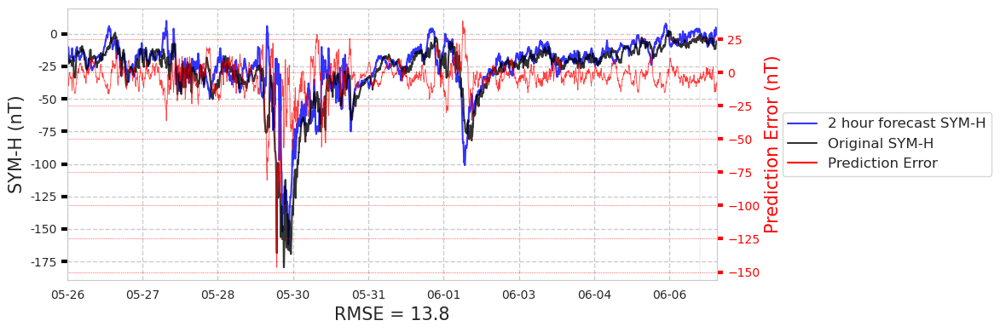

Plot for storm 35


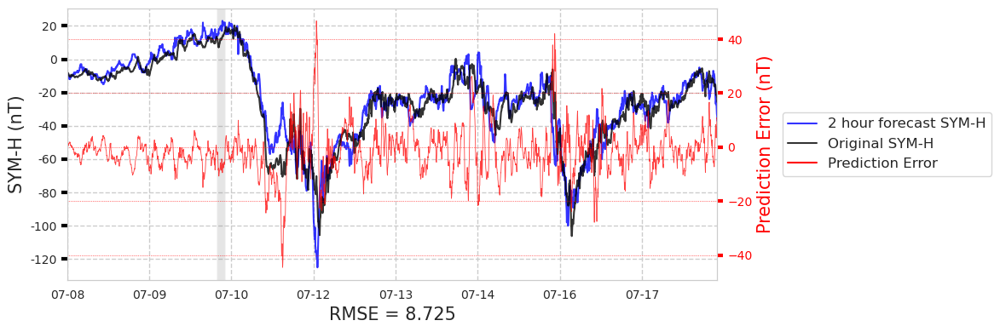

Plot for storm 36


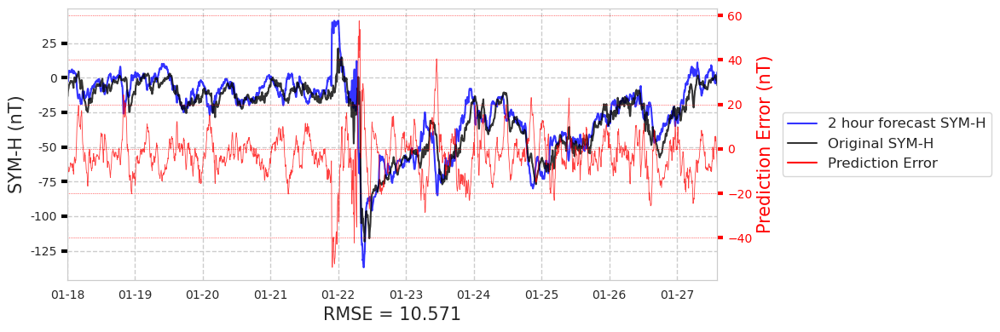

Plot for storm 37


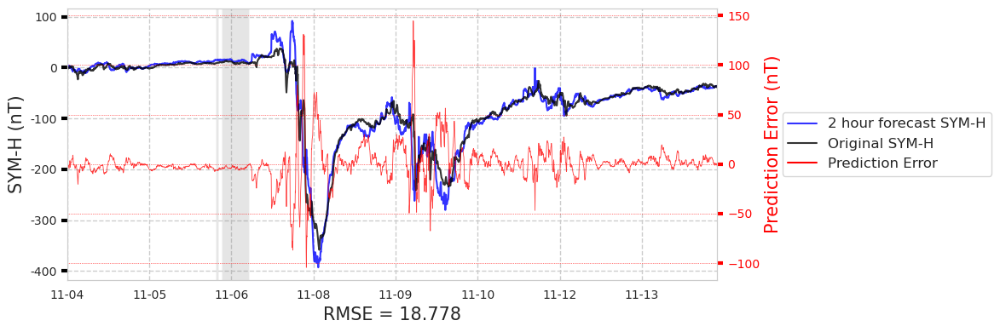

Plot for storm 38


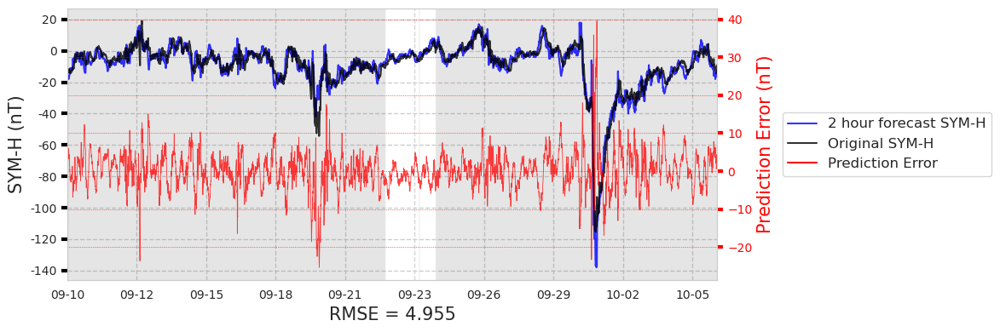

Plot for storm 39


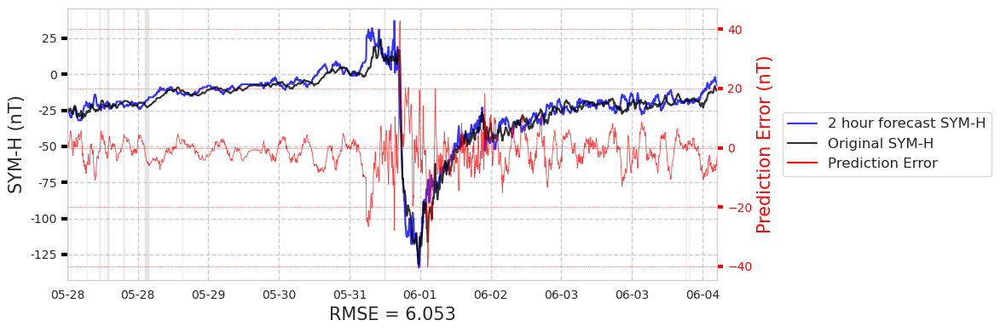

Plot for storm 40


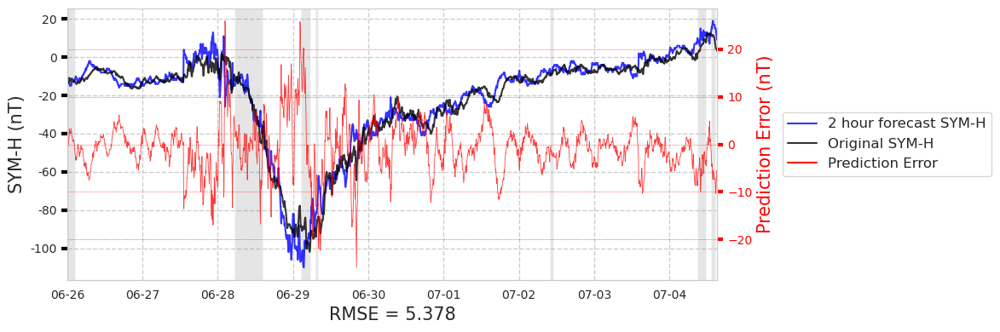

Plot for storm 41


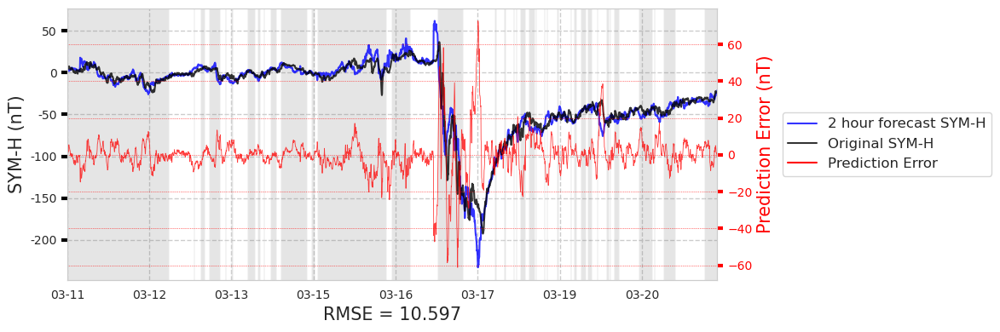

Plot for storm 42


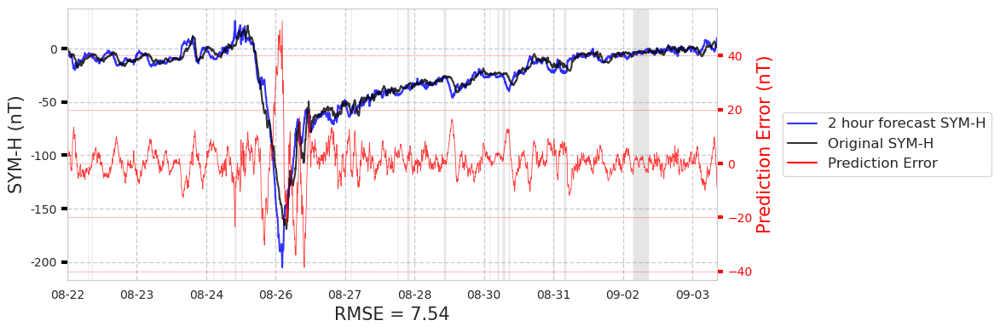

Plot for storm 26


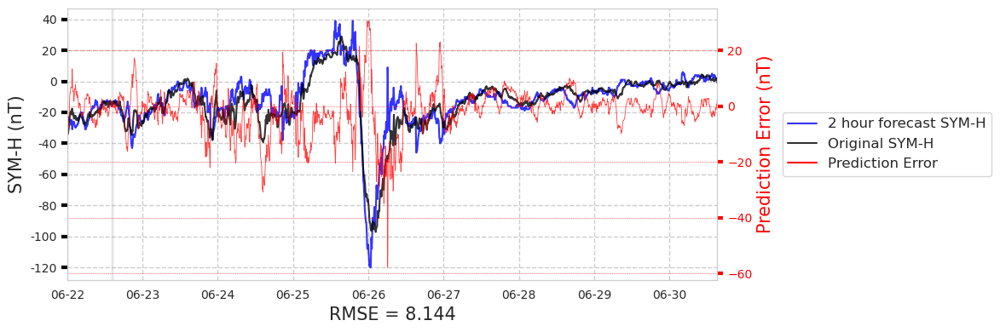

Plot for storm 27


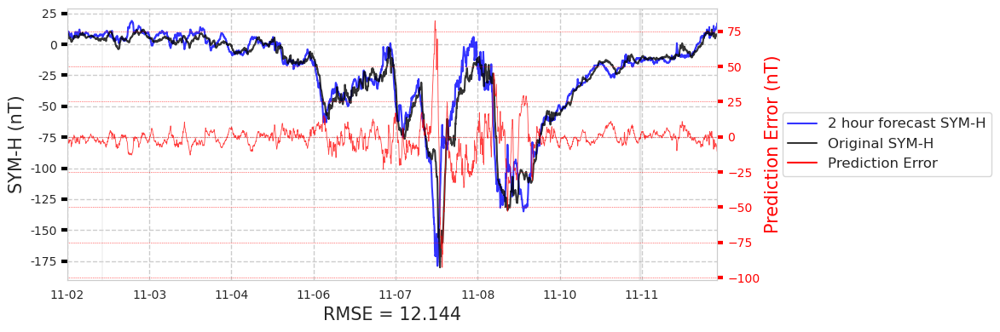

Plot for storm 28


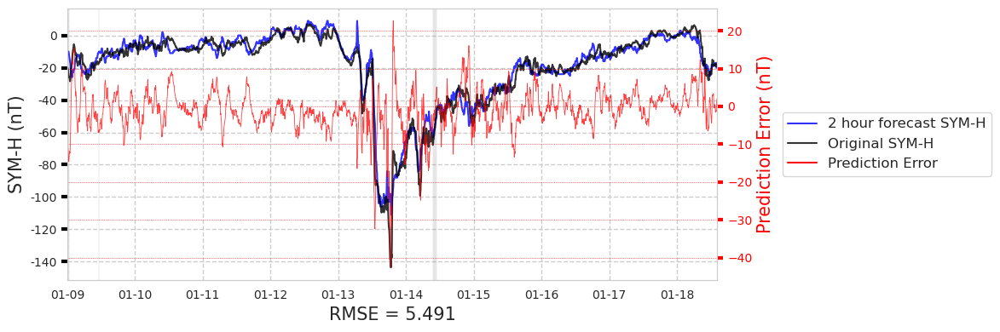

Plot for storm 29


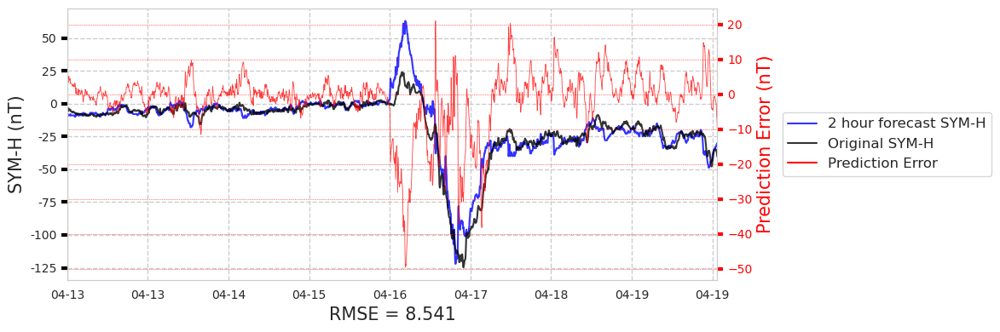

Plot for storm 30


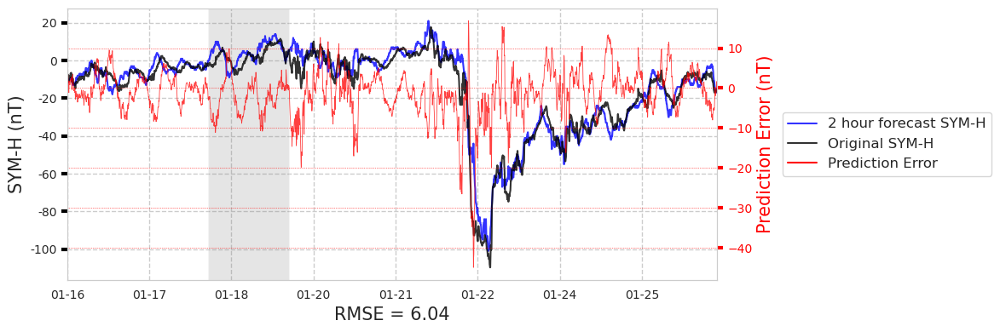

Plot for storm 31


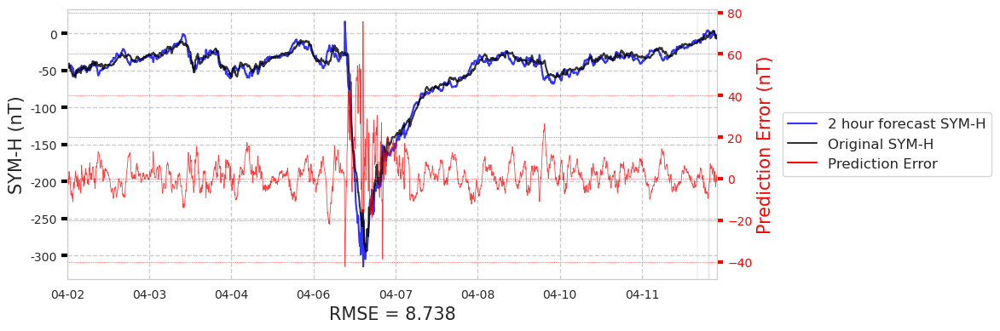

Plot for storm 32


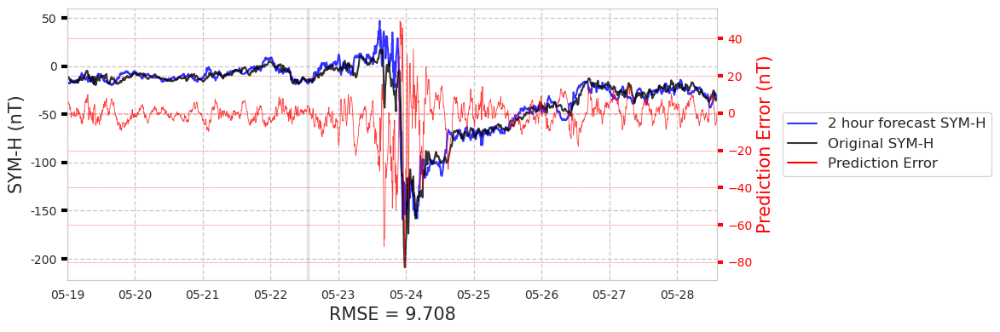

Plot for storm 33


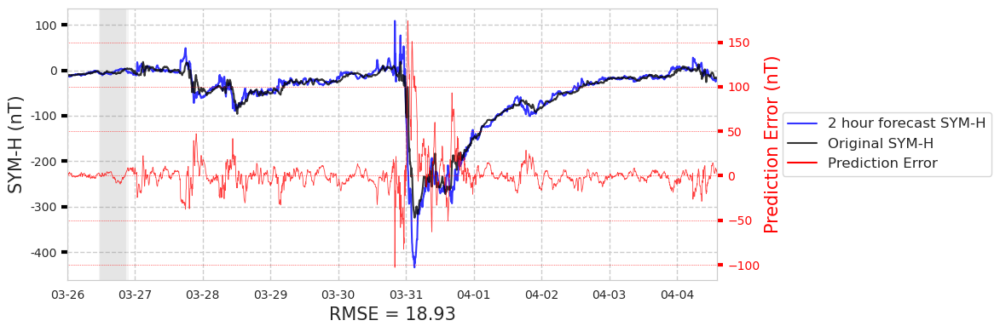

Plot for storm 34


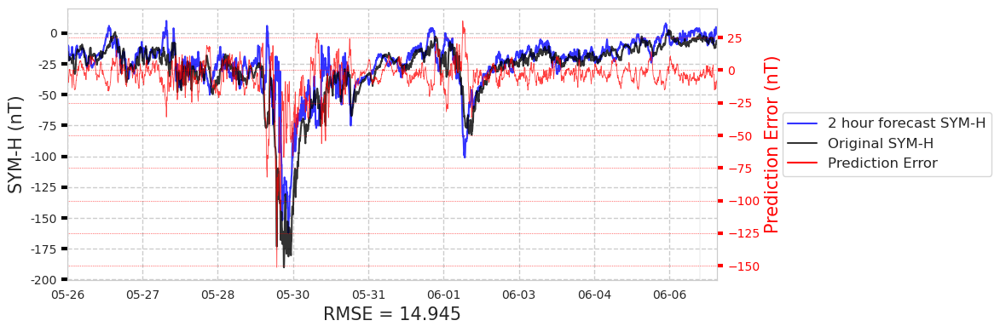

Plot for storm 35


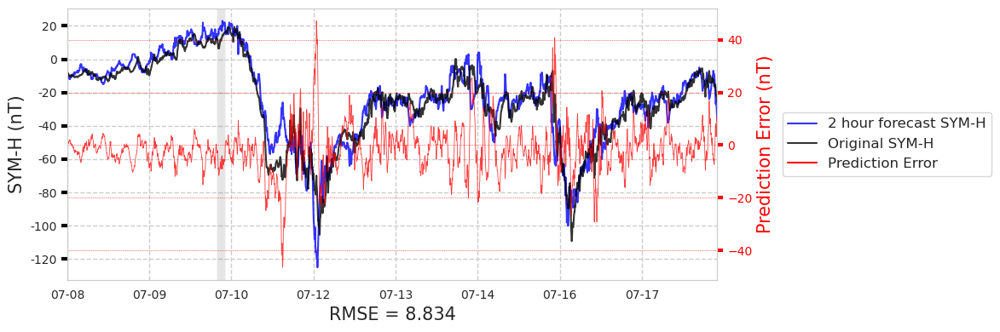

Plot for storm 36


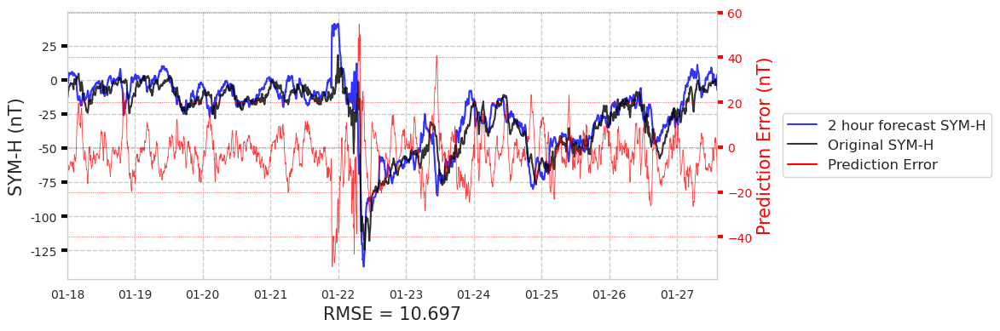

Plot for storm 37


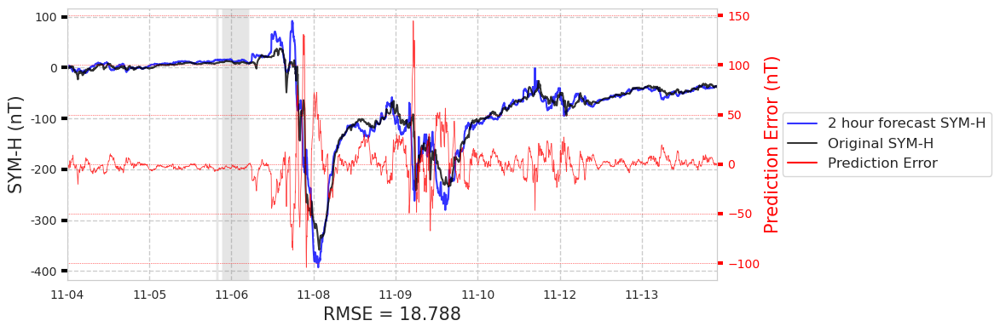

Plot for storm 38


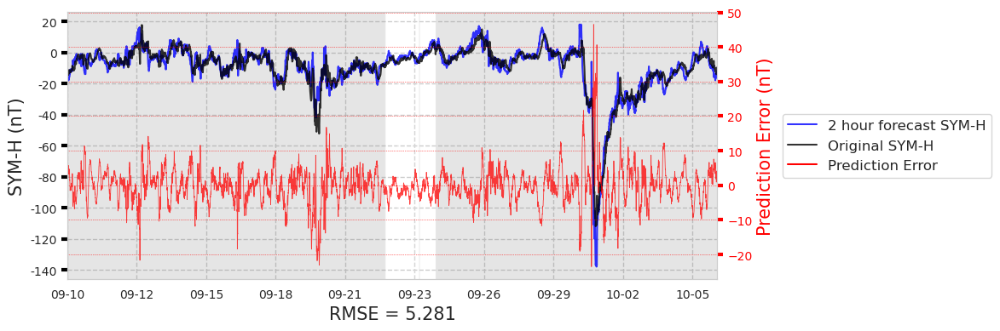

Plot for storm 39


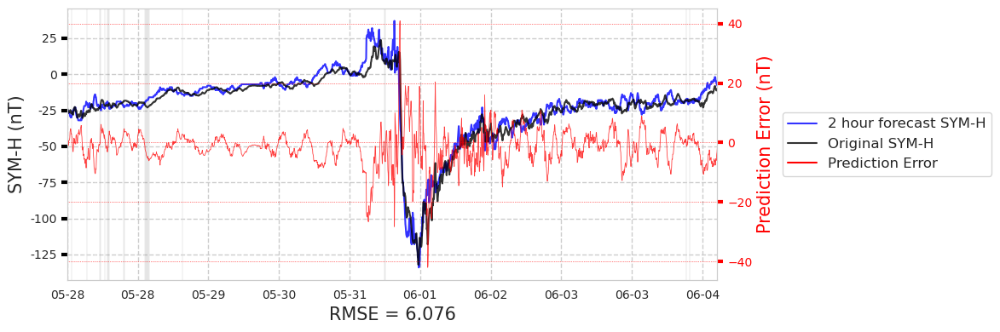

Plot for storm 40


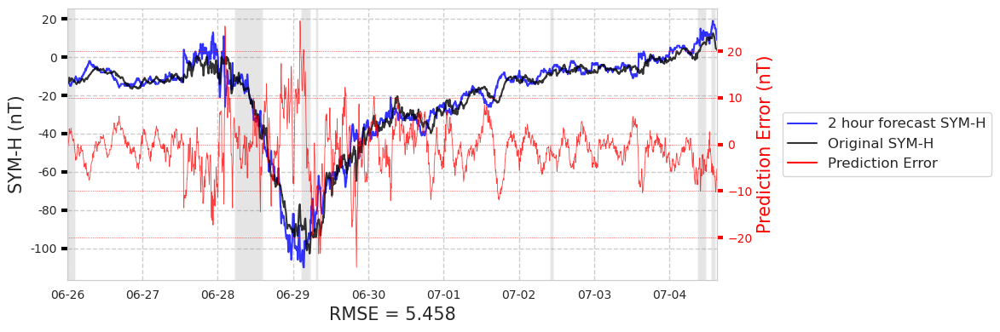

Plot for storm 41


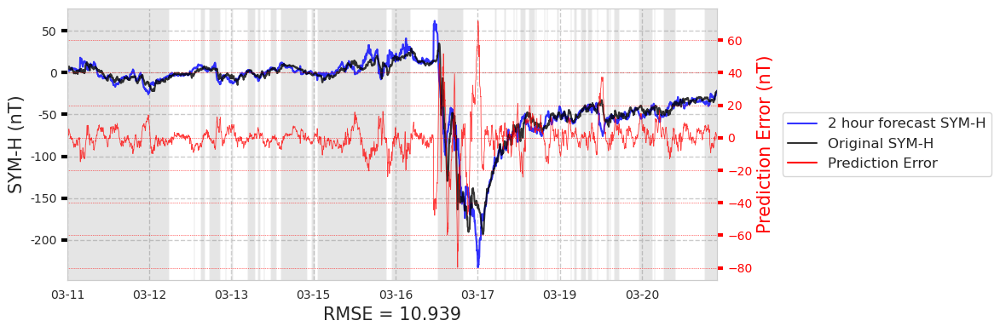

Plot for storm 42


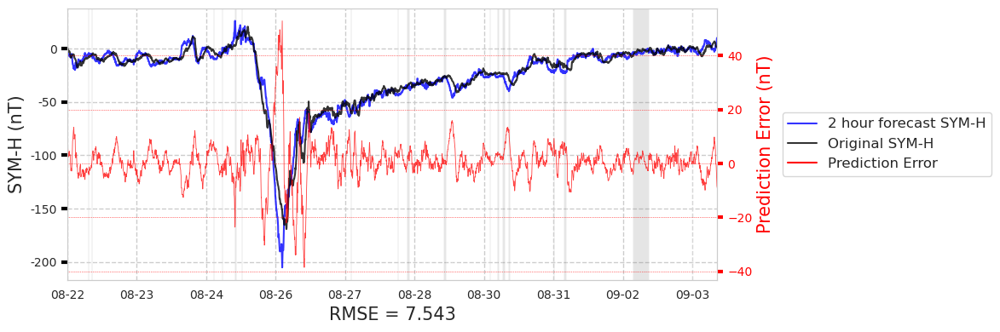

In [14]:
storm_texts = []

base_path = './supporting_information/paper_plots_shade'
os.makedirs(base_path, exist_ok = True)

for pair_index, pair in enumerate(column_pairs):

    df_eval = pair[0].copy()
    og_col = pair[1]
    pred_col = pair[2]
    pred_title = pair[3]
    save_path = pair[4]
    plot_title = pair[5]

    os.makedirs(os.path.join(base_path, save_path), exist_ok = True)

    for i, storm_index in enumerate(storm_indices):

        print(f'Plot for storm {storm_index}')
        
        df = df_eval[TEST_STORM_STARTS[i] : TEST_STORM_ENDS[i]].copy()
        ticks_labels = list(df.index)
        swepam_sect = df_swepam[df.index[0] : df.index[-1]].copy()
        df = df.reset_index()
    
        def format_fn(tick_val, tick_pos):            
            if int(tick_val) in df.index:
                return ticks_labels[int(tick_val)].strftime('%m-%d')
            else:
                return ''

        fig, ax = plt.subplots(1, 1, figsize = (12, 4))
        lin_pred = df[og_col].plot(ax = ax, color = "blue", label = pred_title, alpha = 0.8)
        lin_og = df[pred_col].plot(ax = ax, color = "black", label = "Original SYM-H", alpha = 0.8)
        ax.grid(True, linestyle="--", axis="both", which="both", linewidth=1)
        ax.tick_params(axis="y", color="black", labelsize=10, width=3, length=5)
        ax.tick_params(axis="x", color="black", which = 'both', labelsize=10, width=3, length=5)
        ax.set_ylabel('SYM-H (nT)', fontsize = 15)
        mse = np.round(msem(df[pred_col], df[og_col], squared = False), 3)
        ax.set_xlabel(f'RMSE = {mse}', fontsize = 15)
        
        if pair_index == 0:
            storm_texts.append(f'Storm Number {storm_index} -- {df["datetime"][len(df) // 2].month_name()} of {df["datetime"][len(df) // 2].year}')
            
        twin = ax.twinx()

        df['diff'] = df[pred_col] - df[og_col]
        df['diff'].plot(ax = twin, color = 'red', linewidth = 0.6, alpha = 0.75, label = 'Prediction Error')

        twin.set_ylabel('Prediction Error (nT)', color = 'red', fontsize = 15)
        twin.grid(True, color="red", linestyle=":", axis="y", which="both", linewidth=0.5)
        twin.tick_params(axis="y", colors="red", labelsize=10, width=3, length=5)    
        ax.xaxis.set_major_formatter(format_fn)
        ax.xaxis.set_major_locator(MaxNLocator(integer=True))
        ax.get_yaxis().set_major_formatter(mtick.FormatStrFormatter('%.0f'))
        plt.rcParams['axes.axisbelow'] = True
        
        ax.plot(0,0, color = 'red', label = 'Prediction Error')

        ax.legend(bbox_to_anchor = (1.1, 0.5), loc = 'center left', borderaxespad = 0, prop = {'size' : 12})
        
        ymin, ymax = ax.get_ylim()        
        ax.fill_between(
            df.index,
            -99999,
            99999,
            where = swepam_sect['missing_swepam_float'] == 1,
            facecolor="gray",
            alpha=0.2,
            interpolate = False,            
        )
        
        ax.set_ylim(ymin, ymax)
        ax.set_xlim(df.index[0], df.index[-1])
        
        fig.tight_layout()
        fig.savefig(os.path.join(base_path, save_path, f"{save_path}_storm_{storm_index}.png"), dpi=400)
        plt.show();
        